# Project Description

A taxi company named Sweet Lift has collected historical data on taxi orders at the airport. To attract more drivers during peak hours, it is necessary to predict the number of taxi orders for the next hour. 

We will reate a model for such prediction. The RMSE metric on the test set should not exceed 48.


## Steps

1. Download the data and resample them by one hour.
2. Analyze the data.
3. Train different models with different hyperparameters. The test sample is 10% of the initial dataset.
4. Test the data using the test sample and make conclusions.


The data is stored in the taxi.csv file. The number of orders is in the *num_orders* column.

## Data Preparation

In [1]:
pip install --user prophet

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
import pandas as pd, numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error as mse
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly, plot_cross_validation_metric
import plotly.io as pio
from prophet.diagnostics import cross_validation, performance_metrics
from statsmodels.tsa.stattools import adfuller
from statsmodels.stats.stattools import durbin_watson
from statsmodels.tools.eval_measures import rmse
from statsmodels.api import OLS
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import warnings
warnings.filterwarnings('ignore')

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
df = pd.read_csv('/content/drive/MyDrive/data_projects/taxi.csv', index_col=[0], parse_dates=[0])

In [5]:
df.sort_index(inplace=True)

In [6]:
df = df.resample('1H').sum()

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4416 entries, 2018-03-01 00:00:00 to 2018-08-31 23:00:00
Freq: H
Data columns (total 1 columns):
 #   Column      Non-Null Count  Dtype
---  ------      --------------  -----
 0   num_orders  4416 non-null   int64
dtypes: int64(1)
memory usage: 69.0 KB


In [8]:
df.head()

,num_orders
datetime,
2018-03-01 00:00:00,124
2018-03-01 01:00:00,85
2018-03-01 02:00:00,71
2018-03-01 03:00:00,66
2018-03-01 04:00:00,43


In [9]:
df.index.max()

Timestamp('2018-08-31 23:00:00', freq='H')

In [10]:
df.index.min()

Timestamp('2018-03-01 00:00:00', freq='H')

## Data Analysis

### Plotting

In [11]:
# Create a figure object and add traces for the number of orders
fig = go.Figure()
fig.add_trace(go.Scatter(x=df.index, y=df['num_orders'], name='Number of orders'))

# Set the axis labels and plot title
fig.update_layout(title={
        'text': "Number of Orders 1 March to 31 Aug of 2018",
        'x': 0.5,
        'y': 0.9
    },
                  xaxis_title='Hour', yaxis_title='Number of orders')
fig.update_xaxes(rangeslider_visible=True)
# Show the plot
fig.show()

In [12]:
df.describe()

,num_orders
count,4416.000000
mean,84.422781
std,45.023853
min,0.000000
25%,54.000000
50%,78.000000
75%,107.000000
max,462.000000


In [13]:
# Create histogram trace
hist_trace = go.Histogram(x=df['num_orders'], nbinsx=100)

# Create figure object
fig = go.Figure(hist_trace)

# Update layout to make figure bigger
fig.update_layout(title={
        'text': 'Histogram of Number of Orders',
        'x': 0.5,
        'y': 0.9
    },
    width=900,
    height=400
)

fig.show()

In [14]:
# grouping on average daily orders
daily = df.copy().resample(rule='D').sum()

In [15]:
# grouping on average weekly orders
weekly= df.copy().resample(rule='W').sum()

In [16]:
# grouping on average weekly orders
monthly= df.copy().resample(rule='M').sum()

In [17]:
# find autocorrelation coefficient of average daily orders
autocorrelation = daily.num_orders.autocorr()
autocorrelation

0.9158034356720475

In [18]:
# find autocorrelation coefficient of average weekly orders
autocorrelation_w = weekly.num_orders.autocorr()
autocorrelation_w

0.9354628812413339

In [19]:
# find autocorrelation coefficient of average weekly orders
autocorrelation_m = monthly.num_orders.autocorr()
autocorrelation_m

0.9862793774697619

In [20]:
# Create a figure object and add traces for the number of orders
fig = go.Figure()
fig.add_trace(go.Scatter(x=daily.index, y=daily.num_orders, name='Daily Number of orders'))
fig.add_trace(go.Scatter(x=weekly.index, y=weekly.num_orders, name='Weekly Number of orders'))
fig.add_trace(go.Scatter(x=monthly.index, y=monthly.num_orders, name='Monthly Number of orders'))

# Set the axis labels and plot title
fig.update_layout(title={
        'text': "Number of Orders 1 March to 31 Aug of 2018",
        'x': 0.5,
        'y': 0.9
    },
                  xaxis_title='Hour', yaxis_title='Number of orders')
fig.update_xaxes(rangeslider_visible=True)
# Show the plot
fig.show()

In [21]:
# copy the data
df_copy = df.copy()

# Compute the rolling mean over a 24-hour window
df_copy['rolling_mean'] = df_copy['num_orders'] - df_copy['num_orders'].rolling(window=24, min_periods=1).mean()

# Create a figure object and add traces for the energy consumption and rolling mean lines
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_copy.index, y=df_copy['num_orders'], name='Number of orders'))
fig.add_trace(go.Scatter(x=df_copy.index, y=df_copy['rolling_mean'], name='24-hour rolling mean'))

# Set the axis labels and plot title
fig.update_layout(title='Number of Orders 1 March to 31 Aug of 2018 with 24-hour Rolling Average',
                  xaxis_title='Hour', yaxis_title='Number of orders')
fig.update_xaxes(rangeslider_visible=True)
# Show the plot
fig.show()

In [22]:
# Compute the rolling mean over a 24-hour window
df_copy['rolling_mean_24'] = df_copy['num_orders'].rolling(window=24, min_periods=1).mean()

# Create a figure object and add traces for the energy consumption and rolling mean lines
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_copy.index, y=df_copy['num_orders'], name='Number of orders'))
fig.add_trace(go.Scatter(x=df_copy.index, y=df_copy['rolling_mean_24'], name='24-hour rolling mean'))

# Set the axis labels and plot title
fig.update_layout(title='Number of Orders 1 March to 31 Aug of 2018 with 24-hour Rolling Average',
                  xaxis_title='Hour', yaxis_title='Number of orders')
fig.update_xaxes(rangeslider_visible=True)
# Show the plot
fig.show()

In [23]:
# Compute the rolling mean over a 24-hour window
daily = df_copy['num_orders'].resample('D').sum()

# Create a figure object and add traces for the energy consumption and rolling mean lines
fig = go.Figure()
fig.add_trace(go.Scatter(x=daily.index, y=daily, name='Number of orders'))

# Set the axis labels and plot title
fig.update_layout(title='Daily Number of Orders',
                  xaxis_title='Hour', yaxis_title='Number of orders')
fig.update_xaxes(rangeslider_visible=True)
# Show the plot
fig.show()

In [24]:
# Compute the rolling mean over a 24-hour window
weekly = df_copy['num_orders'].resample('W').sum()

# Create a figure object and add traces for the energy consumption and rolling mean lines
fig = go.Figure()
fig.add_trace(go.Scatter(x=weekly.index, y=weekly, name='Number of orders'))

# Set the axis labels and plot title
fig.update_layout(title='Weekly Number of Orders',
                  xaxis_title='Hour', yaxis_title='Number of orders')
fig.update_xaxes(rangeslider_visible=True)
# Show the plot
fig.show()

In [25]:
# Compute the rolling mean over a 24-hour window
monthly = df_copy['num_orders'].resample('M').sum()

# Create a figure object and add traces for the energy consumption and rolling mean lines
fig = go.Figure()
fig.add_trace(go.Scatter(x=monthly.index, y=monthly, name='Number of orders'))

# Set the axis labels and plot title
fig.update_layout(title='Monthly Number of Orders',
                  xaxis_title='Hour', yaxis_title='Number of orders')
fig.update_xaxes(rangeslider_visible=True)
# Show the plot
fig.show()

In [26]:
df_copy['diff_1'] = df_copy.num_orders.diff(1)
df_copy = df_copy.dropna()

# Create a figure object and add traces for the energy consumption and rolling mean lines
fig = go.Figure()
#fig.add_trace(go.Scatter(x=df_copy.index, y=df_copy.num_orders, name='Number of orders'))
fig.add_trace(go.Scatter(x=df_copy.index, y=df_copy.diff_1, name='Diff 1', line_color='lightgreen'))

# Set the axis labels and plot title
fig.update_layout(title='Number of Orders 1 March to 31 Aug of 2018 with Diff 1',
                  xaxis_title='Hour', yaxis_title='Diff Step 1 of Number of orders')

# Show the plot
fig.show()

In [27]:
df_copy['diff_2'] = df_copy.num_orders.diff(1).diff(1)
df_copy = df_copy.dropna()

# Create a figure object and add traces for the energy consumption and rolling mean lines
fig = go.Figure()
#fig.add_trace(go.Scatter(x=df_copy.index, y=df_copy.num_orders, name='Number of orders'))
fig.add_trace(go.Scatter(x=df_copy.index, y=df_copy.diff_2, name='Diff 2', line_color='lightgreen'))

# Set the axis labels and plot title
fig.update_layout(title='Number of Orders 1 March to 31 Aug of 2018 with Diff 2',
                  xaxis_title='Hour', yaxis_title='Diff Step 2 of Number of orders')

# Show the plot
fig.show()

In [28]:
df_copy['log'] = np.log(df_copy.num_orders/df_copy.num_orders.shift(1))
df_copy.replace([np.inf, -np.inf], np.nan, inplace=True)
df_copy = df_copy.dropna()

# Create a figure object and add traces for the energy consumption and rolling mean lines
fig = go.Figure()
#fig.add_trace(go.Scatter(x=df_copy.index, y=df_copy.num_orders, name='Number of orders'))
fig.add_trace(go.Scatter(x=df_copy.index, y=df_copy.log, name='Log', line_color='lightgreen'))

# Set the axis labels and plot title
fig.update_layout(title='Number of Orders 1 March to 31 Aug of 2018 with Log',
                  xaxis_title='Hour', yaxis_title='Log of Number of orders')

# Show the plot
fig.show()

In [29]:
df_copy['sqrt'] = np.sqrt(df_copy.num_orders)
df_copy = df_copy.dropna()

# Create a figure object and add traces for the energy consumption and rolling mean lines
fig = go.Figure()
#fig.add_trace(go.Scatter(x=df_copy.index, y=df_copy.num_orders, name='Number of orders'))
fig.add_trace(go.Scatter(x=df_copy.index, y=df_copy.sqrt, name='Square Root', line_color='lightgreen'))

# Set the axis labels and plot title
fig.update_layout(title='Number of Orders 1 March to 31 Aug of 2018 with Square Root',
                  xaxis_title='Hour', yaxis_title='Square Root of Number of orders')

# Show the plot
fig.show()

In [30]:
df_copy['change'] = df_copy.num_orders.shift(1)/df_copy.num_orders
df_copy = df_copy.dropna()

# Create a figure object and add traces for the energy consumption and rolling mean lines
fig = go.Figure()
#fig.add_trace(go.Scatter(x=df_copy.index, y=df_copy.num_orders, name='Number of orders'))
fig.add_trace(go.Scatter(x=df_copy.index, y=df_copy.change, name='Change', line_color='lightgreen'))

# Set the axis labels and plot title
fig.update_layout(title='Number of Orders 1 March to 31 Aug of 2018 with Change',
                  xaxis_title='Hour', yaxis_title='Change of Number of orders')

# Show the plot
fig.show()

### Dicky-Fuller Test

In [31]:
results = adfuller(df)
results

(-3.0689242890279504,
 0.028940051402613316,
 30,
 4385,
 {'1%': -3.431842162413052,
  '5%': -2.8621993540813637,
  '10%': -2.567120978470452},
 41728.71357827463)

In [32]:
# adfuller test the first diff
results_diff_1 = adfuller(df_copy.diff_1)
results_diff_1

(-15.858965074748182,
 9.259938597948851e-29,
 31,
 4377,
 {'1%': -3.431844891293811,
  '5%': -2.8622005596114226,
  '10%': -2.5671216202338965},
 41684.43855816119)

In [33]:
# adfuller test the second diff
results_diff_2 = adfuller(df_copy.diff_2)
results_diff_2

(-18.893611521696215,
 0.0,
 31,
 4377,
 {'1%': -3.431844891293811,
  '5%': -2.8622005596114226,
  '10%': -2.5671216202338965},
 42593.73404124148)

In [34]:
# adfuller test the log
results_log = adfuller(df_copy.log)
results_log

(-16.547522742001306,
 1.95851656862534e-29,
 29,
 4379,
 {'1%': -3.431844208138311,
  '5%': -2.8622002578158217,
  '10%': -2.5671214595731113},
 3863.5342327539174)

### ACF-PACF

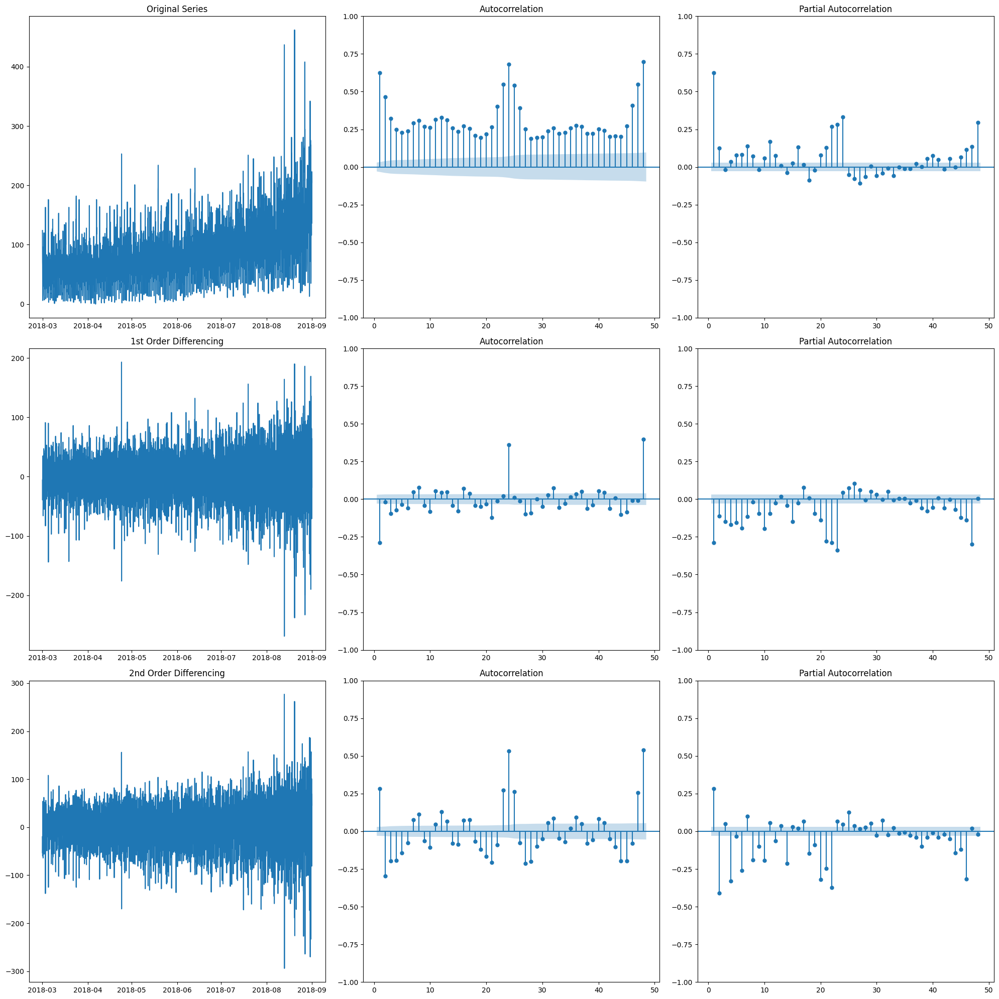

In [35]:
# plotting ACF-PACF

fig, axes = plt.subplots(3, 3, figsize = (20,20))
# Original Series
axes[0, 0].plot(df['num_orders']); axes[0, 0].set_title('Original Series')
plot_acf(df['num_orders'], ax=axes[0, 1], lags=48, zero=False)
plot_pacf(df['num_orders'], ax=axes[0, 2], lags=48, zero=False)

# 1st Differencing
axes[1, 0].plot(df['num_orders'].diff(1)); axes[1, 0].set_title('1st Order Differencing')
plot_acf(df['num_orders'].diff(1).dropna(), ax=axes[1, 1], lags=48, zero=False)
plot_pacf(df['num_orders'].diff(1).dropna(), ax=axes[1, 2], lags=48, zero=False)

# 2nd Differencing
axes[2, 0].plot(df['num_orders'].diff(2)); axes[2, 0].set_title('2nd Order Differencing')
plot_acf(df['num_orders'].diff(2).dropna(), ax=axes[2, 1], lags=48, zero=False)
plot_pacf(df['num_orders'].diff(2).dropna(), ax=axes[2, 2], lags=48, zero=False)

plt.tight_layout()
plt.show()

In [36]:
# make a seasonal difference
df_copy['seasonal_diff'] = df_copy.num_orders.diff(1).diff(24)
df_copy = df_copy.dropna()

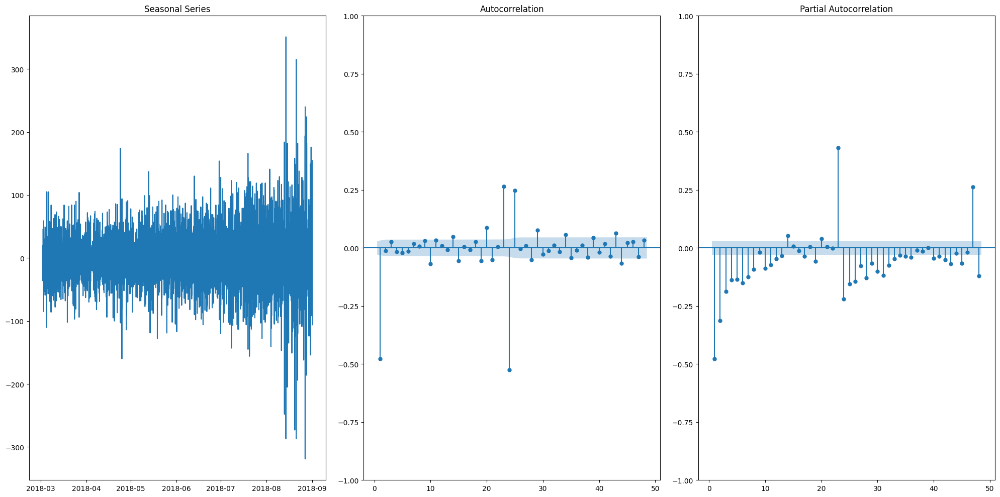

In [37]:
# plotting ACF-PACF
fig, axes = plt.subplots(1, 3, figsize = (20,10))
# Original Series
axes[0].plot(df_copy['seasonal_diff']); axes[0].set_title('Seasonal Series')
plot_acf(df_copy['seasonal_diff'], ax=axes[1], lags=48, zero=False)
plot_pacf(df_copy['seasonal_diff'], ax=axes[2], lags=48, zero=False)

plt.tight_layout()
plt.show()

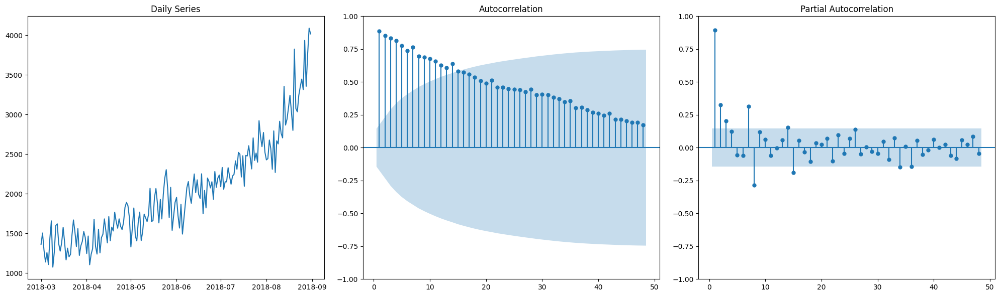

In [38]:
# plotting ACF-PACF for daily data
fig, axes = plt.subplots(1, 3, figsize = (20,6))
# Original Series
axes[0].plot(daily); axes[0].set_title('Daily Series')
plot_acf(daily, ax=axes[1], lags=48, zero=False)
plot_pacf(daily, ax=axes[2], lags=48, zero=False)

plt.tight_layout()
plt.show()

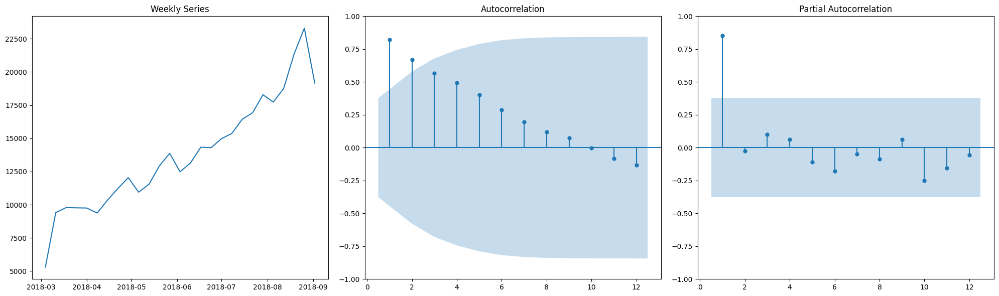

In [39]:
# plotting ACF-PACF for weekly data
fig, axes = plt.subplots(1, 3, figsize = (20,6))
# Original Series
axes[0].plot(weekly); axes[0].set_title('Weekly Series')
plot_acf(weekly, ax=axes[1], lags=12, zero=False)
plot_pacf(weekly, ax=axes[2], lags=12, zero=False)

plt.tight_layout()
plt.show()

### Subsetting the Data

In [40]:
# Subset the data
df_2_weeks = df['2018-03-04':'2018-03-19'].copy()

# Compute the rolling mean over a 3-hour window
df_2_weeks['rolling_mean'] = df_2_weeks.rolling(window=4, min_periods=1).mean()

# Create a figure object and add traces for the energy consumption and rolling mean lines
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_2_weeks.index, y=df_2_weeks['num_orders'], name='Number of orders'))
fig.add_trace(go.Scatter(x=df_2_weeks.index, y=df_2_weeks['rolling_mean'], name='4-hour rolling mean'))

# Set the axis labels and plot title
fig.update_layout(title='Number of Orders in Sunday to Monday, 4 to 19 March of 2018 with 4-hour Rolling Average',
                  xaxis_title='Hour', yaxis_title='Number of orders')

# Show the plot
fig.show()

In [41]:
# Subset the data for 15 days from Sunday to Monday
df_2_weeks_2 = df['2018-03-18':'2018-04-02'].copy()

# Compute the rolling mean over a 3-hour window
df_2_weeks_2['rolling_mean'] = df_2_weeks_2.rolling(window=4, min_periods=1).mean()

# Create a figure object and add traces for the energy consumption and rolling mean lines
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_2_weeks_2.index, y=df_2_weeks_2['num_orders'], name='Number of orders'))
fig.add_trace(go.Scatter(x=df_2_weeks_2.index, y=df_2_weeks_2['rolling_mean'], name='4-hour rolling mean'))

# Set the axis labels and plot title
fig.update_layout(title='Number of Orders in Sunday to Monday, 18 March to 2 April of 2018 with 4-hour Rolling Average',
                  xaxis_title='Hour', yaxis_title='Number of orders')

# Show the plot
fig.show()

In [42]:
# Subset the data for 15 days from Sunday to Monday
df_5_weeks = df['2018-04-29':'2018-06-04'].copy()

# Compute the rolling mean over a 3-hour window
df_5_weeks['rolling_mean'] = df_5_weeks.rolling(window=4, min_periods=1).mean()

# Create a figure object and add traces for the energy consumption and rolling mean lines
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_5_weeks.index, y=df_5_weeks['num_orders'], name='Number of orders'))
fig.add_trace(go.Scatter(x=df_5_weeks.index, y=df_5_weeks['rolling_mean'], name='4-hour rolling mean'))

# Set the axis labels and plot title
fig.update_layout(title='Number of Orders in Sunday to Monday, 29 April to 4 June of 2018 with 4-hour Rolling Average',
                  xaxis_title='Hour', yaxis_title='Number of orders')

# Show the plot
fig.show()

In [43]:
# Subset the data for 15 days from Sunday to Monday
df_4_weeks = df['2018-06-03':'2018-07-02'].copy()

# Compute the rolling mean over a 3-hour window
df_4_weeks['rolling_mean'] = df_4_weeks.rolling(window=4, min_periods=1).mean()

# Create a figure object and add traces for the energy consumption and rolling mean lines
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_4_weeks.index, y=df_4_weeks['num_orders'], name='Number of orders'))
fig.add_trace(go.Scatter(x=df_4_weeks.index, y=df_4_weeks['rolling_mean'], name='4-hour rolling mean'))

# Set the axis labels and plot title
fig.update_layout(title='Number of Orders in Sunday to Monday, 3 June to 2 July of 2018 with 4-hour Rolling Average',
                  xaxis_title='Hour', yaxis_title='Number of orders')

# Show the plot
fig.show()

In [44]:
# Subset the data
df_end_aug = df['2018-08-17':'2018-08-31'].copy()

# Compute the rolling mean over a 3-hour window
df_end_aug['rolling_mean'] = df_end_aug.rolling(window=4, min_periods=1).mean()

# Create a figure object and add traces for the energy consumption and rolling mean lines
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_end_aug.index, y=df_end_aug['num_orders'], name='Number of orders'))
fig.add_trace(go.Scatter(x=df_end_aug.index, y=df_end_aug['rolling_mean'], name='4-hour rolling mean'))

# Set the axis labels and plot title
fig.update_layout(title='Number of Orders in 17 to 31 Aug of 2018 with 4-hour Rolling Average',
                  xaxis_title='Hour', yaxis_title='Number of orders')

# Show the plot
fig.show()

### Trend, Seasonality, and Residue

In [45]:
decomposed_df_24 = seasonal_decompose(df, period=24)

fig = go.Figure()

# Add subplots for the trend, seasonality, and residuals
fig.add_trace(go.Scatter(x=decomposed_df_24.trend.index, y=decomposed_df_24.trend, name='Trend'))
fig.add_trace(go.Scatter(x=decomposed_df_24.seasonal.index, y=decomposed_df_24.seasonal, name='Seasonality'))
fig.add_trace(go.Scatter(x=decomposed_df_24.resid.index, y=decomposed_df_24.resid, name='Residuals'))

# Update the layout to include titles for each subplot and adjust the subplot spacing
fig.update_layout(title='Seasonal Decomposition of Number of Orders 1 March to 31 Aug of 2018',
                  height=1000, width=1000,
                  xaxis=dict(title='Date'),
                  yaxis1=dict(title='Number of Orders', domain=[0.7, 1]),
                  yaxis2=dict(title='Trend', domain=[0.45, 0.65]),
                  yaxis3=dict(title='Seasonality', domain=[0.2, 0.4]),
                  yaxis4=dict(title='Residuals', domain=[0, 0.2]),
                  margin=dict(t=100, b=100),
                  template='plotly_white')

fig.show()


In [46]:
decomposed_df = seasonal_decompose(df)

fig = go.Figure()

# Add subplots for the trend, seasonality, and residuals
fig.add_trace(go.Scatter(x=decomposed_df.trend.index, y=decomposed_df.trend, name='Trend'))
fig.add_trace(go.Scatter(x=decomposed_df.seasonal.index, y=decomposed_df.seasonal, name='Seasonality'))
fig.add_trace(go.Scatter(x=decomposed_df.resid.index, y=decomposed_df.resid, name='Residuals'))

# Update the layout to include titles for each subplot and adjust the subplot spacing
fig.update_layout(title='Seasonal Decomposition of Number of Orders 1 March to 31 Aug of 2018',
                  height=1000, width=1000,
                  xaxis=dict(title='Date'),
                  yaxis1=dict(title='Number of Orders', domain=[0.7, 1]),
                  yaxis2=dict(title='Trend', domain=[0.45, 0.65]),
                  yaxis3=dict(title='Seasonality', domain=[0.2, 0.4]),
                  yaxis4=dict(title='Residuals', domain=[0, 0.2]),
                  margin=dict(t=100, b=100),
                  template='plotly_white')

fig.show()


In [47]:
# perform seasonal decomposition on hourly data
decomposition = seasonal_decompose(df['num_orders'])

# extract the trend, seasonality, and residual components
trend = decomposition.trend
seasonality = decomposition.seasonal
residual = decomposition.resid

# create a subplot with four rows and one column
fig = make_subplots(rows=4, cols=1, shared_xaxes=True, 
                    subplot_titles=('Original Data', 'Trend', 'Seasonality', 'Residuals'))

# add traces for each component
fig.add_trace(go.Scatter(x=df.index, y=df['num_orders'], name='Original Data'), row=1, col=1)
fig.add_trace(go.Scatter(x=df.index, y=trend, name='Trend'), row=2, col=1)
fig.add_trace(go.Scatter(x=df.index, y=seasonality, name='Seasonality'), row=3, col=1)
fig.add_trace(go.Scatter(x=df.index, y=residual, name='Residuals'), row=4, col=1)

# update x-axis and y-axis labels
fig.update_xaxes(title_text='Date', row=4, col=1)
fig.update_yaxes(title_text='Number of Orders', row=1, col=1)
fig.update_yaxes(title_text='Trend', row=2, col=1)
fig.update_yaxes(title_text='Seasonality', row=3, col=1)
fig.update_yaxes(title_text='Residuals', row=4, col=1)

# update the layout of the subplot
fig.update_layout(title='Seasonal Decomposition 1 March to 31 Aug of 2018',
                  height=800, width=1000)
fig.update_xaxes(rangeslider_visible=True, row=4, col=1)
# show the plot
fig.show()

In [48]:
# perform seasonal decomposition daily data
decomposition_D = seasonal_decompose(daily, period=24)

# extract the trend, seasonality, and residual components
trend = decomposition_D.trend
seasonality = decomposition_D.seasonal
residual = decomposition_D.resid

# create a subplot with four rows and one column
fig = make_subplots(rows=4, cols=1, shared_xaxes=True, 
                    subplot_titles=('Daily Data', 'Trend', 'Seasonality', 'Residuals'))

# add traces for each component
fig.add_trace(go.Scatter(x=daily.index, y=daily, name='Daily Data'), row=1, col=1)
fig.add_trace(go.Scatter(x=daily.index, y=trend, name='Trend'), row=2, col=1)
fig.add_trace(go.Scatter(x=daily.index, y=seasonality, name='Seasonality'), row=3, col=1)
fig.add_trace(go.Scatter(x=daily.index, y=residual, name='Residuals'), row=4, col=1)


# update x-axis and y-axis labels
fig.update_xaxes(title_text='Date', row=4, col=1)
fig.update_yaxes(title_text='Daily Orders', row=1, col=1)
fig.update_yaxes(title_text='Trend', row=2, col=1)
fig.update_yaxes(title_text='Seasonality', row=3, col=1)
fig.update_yaxes(title_text='Residuals', row=4, col=1)

# update the layout of the subplot
fig.update_layout(title='Seasonal Decomposition of Time Series',
                  height=800, width=1000)

fig.update_xaxes(rangeslider_visible=True, row=4, col=1)

# show the plot
fig.show()

### Interim Conclusions

We take a look at plots of the dataset, taking Dicky Fuller test, taking ACF-PACF plot, and taking a look at seasonal decomposition.

it seems that the time series experiencing more upward trend especially since the start of July to the end of August.

From the ACF PACF we get to know that the time series in non stationary.

There are trends and seasonalilty.

Resampling it to daily, or weekly, the seasonality disappears. But the trend is obvious. This means the time series has daily seasonality, and also trends.

The Dicky-Fuller test measure for non-stationarity. The null hypothesis is time series is non-stationary due to trend.
The dataset Fuller test result shows the p-value as 0.0289. As this is below alpha 0.05, we might be able reject the null hypothesis, and therefore according to Dicky-Fuller test the data can be assumed as stationary. However to affirm this inference, attending to plotting of the time series to actually visualize the data is also important.

From attending to the seasonal decomposition plots, it shows more clearly that the season for taxi orders experience highest peak at late up to midnight.

- It is the slowest 6 AM, 
- then picking up at 7 AM to 10 AM, 
- then slowing down again around noon
- then picking up again at 4 PM
- then continuing the increase until it is reaching its highest peak 1 AM in the next morning

In addition to daily seasonality, the time series experiences upward trend especially since the start of July to the end of August. It also appears to have some random noise.

From the ACF and PACF plots it appears that for the original have peak at every 24 steps.

This confirms that there is 24-steps seasonality.

ARIMA models are suitable for modeling time series data with non-seasonal patterns, but they do not include seasonal components.

Here is how we are going to design for ARIMA models:

- To capture the auto-regresiveness of each observation to the previous observation, the order of autoregressive component (p) will be applied. 
- To remove trend or seasonality in the time series data, the order of differencing (d) will be used
- To capture the effect of the shock values or other external factors on the time series data, the order of the moving average component (q) will be applied.

Because it is likely that there is a seasonal component present in the data, a SARIMA model will also be used to account for this seasonality. 

Looking at the seasonal differenced ACF-PACF plot where time series is differenced 1 and 24, it seems the SARIMA order will be MA(1), with D=1, and S=24.

## Feature Engineering

In [49]:
# add more features with attributes
def make_features(df, max_lag, rolling_quarter, rolling_sixth, rolling_eight):
    df['month'] = df.index.month
    df['week'] = df.index.week
    df['day'] = df.index.day
    df['dayofweek'] = df.index.dayofweek +1
    df['hour'] = df.index.hour

    # add lag shift
    for lag in range(1, max_lag + 1):
        df['lag_{}'.format(lag)] = df['num_orders'].shift(lag)
        
    # add rolling means
    df['rolling_mean_quarter'] = (
        df['num_orders'].shift().rolling(rolling_quarter, min_periods=1).mean()
    )
    df['rolling_mean_sixth'] = (
        df['num_orders'].shift().rolling(rolling_sixth, min_periods=1).mean()
    )
    df['rolling_mean_eight'] = (
        df['num_orders'].shift().rolling(rolling_eight, min_periods=1).mean()
    )
        
    # Create a new feature for time of day
    df['time_of_day'] = df['hour'].apply(lambda x: 
        1 if 2 <= x < 7 else 
        2 if 7 <= x < 16 else 
        3 if 16 <= x < 18 else 
        4
    )
    
    # create a new feature for the season of the month: 
    # March to May is Spring(0)
    # June to August is Summer(1)
    df['season'] = df['month'].apply(lambda x: 
        0 if 3 <= x < 6 else 
        1) 
    
    # create a new feature for flagging the midnight : 
    # 10 PM to 1 AM is midnight then it is 1
    # otherwise is 0
    df['midnight'] = df['hour'].apply(lambda x: 
        1 if 18 <= x < 24 or 0 <= x < 2 else 
        0) 
    
    # add diff up to steps 4
    df['diff'] = df['num_orders'].shift(1).diff()
    df['diff_2'] = df['num_orders'].shift(1).diff().diff()
    df['diff_3'] = df['num_orders'].shift(1).diff().diff().diff()
    df['diff_4'] = df['num_orders'].shift(1).diff().diff().diff().diff()
    
    # add log
    df['log'] = np.log(df['num_orders'].shift(1)/df['num_orders'].shift(2))
    
    # Add lagged differences between num_orders and other variables
    for i in range(3, max_lag+1):
        for col in ['rolling_mean_quarter', 'rolling_mean_sixth', 'rolling_mean_eight']:
            df[f'{col}_diff_lag_{i}'] = df['num_orders'].shift().diff(i) - df[col].shift().diff(i)
            
    # add suare root
    df['sqrt'] = np.sqrt(df.num_orders.shift(1))




In [50]:
df_fe = df.copy()
make_features(df_fe, 4, 6, 4, 3)

In [51]:
df_fe.columns

Index(['num_orders', 'month', 'week', 'day', 'dayofweek', 'hour', 'lag_1',
       'lag_2', 'lag_3', 'lag_4', 'rolling_mean_quarter', 'rolling_mean_sixth',
       'rolling_mean_eight', 'time_of_day', 'season', 'midnight', 'diff',
       'diff_2', 'diff_3', 'diff_4', 'log', 'rolling_mean_quarter_diff_lag_3',
       'rolling_mean_sixth_diff_lag_3', 'rolling_mean_eight_diff_lag_3',
       'rolling_mean_quarter_diff_lag_4', 'rolling_mean_sixth_diff_lag_4',
       'rolling_mean_eight_diff_lag_4', 'sqrt'],
      dtype='object')

In [52]:
# Compute the correlation matrix
corr_matrix = df_fe.corr()['num_orders']

# Extract the column names from the correlation matrix
cols = list(corr_matrix.index)

# Convert the correlation matrix to a 2D list of formatted text labels
text = corr_matrix.apply(lambda x: 'Value: {:.2f}'.format(x)).values.tolist()

# Create a heatmap chart
fig = go.Figure(data=go.Heatmap(z=[corr_matrix.values],
                                 x=cols,
                                 y=['num_orders'],
                                 colorscale='Viridis',
                                 text=text))

# Set the layout
fig.update_layout(title='Heatmap of Correlation Matrix',
                  xaxis_title='Variables',
                  yaxis_title='num_orders')

# Add annotations to the heatmap cells
for i in range(len(cols)):
    fig.add_annotation(x=cols[i], y ='num_orders',
                           text='{:.2f}'.format(corr_matrix.values[i]),
                           showarrow=False,
                           font=dict(size=8, color='white'),
                           xref='x',
                           yref='y')

# Show the chart
fig.show()

In [53]:
df_fe.head()

,num_orders,month,week,day,dayofweek,hour,lag_1,lag_2,lag_3,lag_4,...,diff_3,diff_4,log,rolling_mean_quarter_diff_lag_3,rolling_mean_sixth_diff_lag_3,rolling_mean_eight_diff_lag_3,rolling_mean_quarter_diff_lag_4,rolling_mean_sixth_diff_lag_4,rolling_mean_eight_diff_lag_4,sqrt
datetime,,,,,,,,,,,,,,,,,,,,,
2018-03-01 00:00:00,124,3,9,1,4,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-03-01 01:00:00,85,3,9,1,4,1,124.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.135529
2018-03-01 02:00:00,71,3,9,1,4,2,85.0,124.0,NaN,NaN,...,NaN,NaN,-0.377630,NaN,NaN,NaN,NaN,NaN,NaN,9.219544
2018-03-01 03:00:00,66,3,9,1,4,3,71.0,85.0,124.0,NaN,...,NaN,NaN,-0.179971,NaN,NaN,NaN,NaN,NaN,NaN,8.426150
2018-03-01 04:00:00,43,3,9,1,4,4,66.0,71.0,85.0,124.0,...,-16.0,NaN,-0.073025,NaN,NaN,NaN,NaN,NaN,NaN,8.124038


In [54]:
df_fe.isna().mean()

num_orders                         0.000000
month                              0.000000
week                               0.000000
day                                0.000000
dayofweek                          0.000000
hour                               0.000000
lag_1                              0.000226
lag_2                              0.000453
lag_3                              0.000679
lag_4                              0.000906
rolling_mean_quarter               0.000226
rolling_mean_sixth                 0.000226
rolling_mean_eight                 0.000226
time_of_day                        0.000000
season                             0.000000
midnight                           0.000000
diff                               0.000453
diff_2                             0.000679
diff_3                             0.000906
diff_4                             0.001132
log                                0.000453
rolling_mean_quarter_diff_lag_3    0.001132
rolling_mean_sixth_diff_lag_3   

In [55]:
# remove infinite and missing value
df_fe.replace([np.inf, -np.inf], np.nan, inplace=True)
df_fe=df_fe.dropna()

In [56]:
df_fe.shape

(4408, 28)

In [57]:
# train test split data, test size 10%
train, test = train_test_split(df_fe, shuffle=False, test_size=0.1)

In [58]:
train.tail(3)

,num_orders,month,week,day,dayofweek,hour,lag_1,lag_2,lag_3,lag_4,...,diff_3,diff_4,log,rolling_mean_quarter_diff_lag_3,rolling_mean_sixth_diff_lag_3,rolling_mean_eight_diff_lag_3,rolling_mean_quarter_diff_lag_4,rolling_mean_sixth_diff_lag_4,rolling_mean_eight_diff_lag_4,sqrt
datetime,,,,,,,,,,,,,,,,,,,,,
2018-08-13 12:00:00,92,8,33,13,1,12,144.0,156.0,137.0,91.0,...,-4.0,17.0,-0.080043,113.666667,30.00,-12.333333,204.666667,114.25,74.333333,12.000000
2018-08-13 13:00:00,119,8,33,13,1,13,92.0,144.0,156.0,137.0,...,-9.0,-5.0,-0.448025,-52.166667,-107.25,-125.333333,51.500000,-48.25,-82.000000,9.591663
2018-08-13 14:00:00,102,8,33,13,1,14,119.0,92.0,144.0,156.0,...,119.0,128.0,0.257335,-53.666667,-86.00,-78.666667,-29.500000,-80.50,-83.333333,10.908712


In [59]:
test.head(3)

,num_orders,month,week,day,dayofweek,hour,lag_1,lag_2,lag_3,lag_4,...,diff_3,diff_4,log,rolling_mean_quarter_diff_lag_3,rolling_mean_sixth_diff_lag_3,rolling_mean_eight_diff_lag_3,rolling_mean_quarter_diff_lag_4,rolling_mean_sixth_diff_lag_4,rolling_mean_eight_diff_lag_4,sqrt
datetime,,,,,,,,,,,,,,,,,,,,,
2018-08-13 15:00:00,175,8,33,13,1,15,102.0,119.0,92.0,144.0,...,-123.0,-242.0,-0.154151,-69.833333,-64.00,-32.333333,-84.000000,-98.5,-83.333333,10.099505
2018-08-13 16:00:00,144,8,33,13,1,16,175.0,102.0,119.0,92.0,...,134.0,257.0,0.539813,63.500000,100.75,124.333333,1.333333,22.5,54.666667,13.228757
2018-08-13 17:00:00,152,8,33,13,1,17,144.0,175.0,102.0,119.0,...,-194.0,-328.0,-0.194973,3.500000,35.25,23.666667,26.166667,62.0,65.666667,12.000000


In [60]:
train.shape

(3967, 28)

In [61]:
test.shape

(441, 28)

In [62]:
# part the features and the target
X_train = train.drop(['num_orders'], axis = 1)
y_train = train['num_orders']
X_test = test.drop(['num_orders'], axis = 1)
y_test = test['num_orders']

## Linear Regression

Let us start with an approach of linear regression.

In [63]:
LR = LinearRegression()
LR.fit(X_train, y_train)

pred_train_LR = LR.predict(X_train)

print("RMSE of training set: ", np.sqrt(mse(y_train, pred_train_LR)))

RMSE of training set:  27.846902267443223


In [64]:
pred_test_LR = LR.predict(X_test)
print("RMSE of test set: ", np.sqrt(mse(y_test, pred_test_LR)))

RMSE of test set:  51.69841938625295


In [65]:
pred_test_LR = pd.DataFrame(pred_test_LR, index= X_test.index)

In [66]:
pred_train_LR = pd.DataFrame(pred_train_LR, index= X_train.index)

In [67]:
# Define contrasting colors for the three traces
train_color = 'yellow'
pred_color = 'indianred'

# Create traces for the train, test, and prediction data
trace_train = go.Scatter(x=y_train.index, y=y_train, name='Train', line=dict(color=train_color))
trace_pred = go.Scatter(x=pred_train_LR.index, y=pred_train_LR[0], name='LR Train Predictions', line=dict(color=pred_color))

# Create the figure layout and add the traces
fig = go.Figure(data=[trace_train, trace_pred])
fig.update_layout(title='Plot Title', xaxis_title='Index', yaxis_title='Y Axis Label')

# Show the legend
fig.update_layout(showlegend=True)

# Display the plot
fig.show()


In [68]:
import plotly.graph_objs as go

# Define contrasting colors for the three traces
test_color = 'yellow'
pred_color = 'indianred'

# Create traces for the train, test, and prediction data
trace_test = go.Scatter(x=y_test.index, y=y_test, name='Test', line=dict(color=test_color))
trace_pred = go.Scatter(x=pred_test_LR.index, y=pred_test_LR[0], name='LR Test Predictions', line=dict(color=pred_color))

# Create the figure layout and add the traces
fig = go.Figure(data=[ trace_test, trace_pred])
fig.update_layout(title='Plot Title', xaxis_title='Index', yaxis_title='Y Axis Label')

# Show the legend
fig.update_layout(showlegend=True)

# Display the plot
fig.show()


### Interim Conclusion 

The linear regression model seems to be succesful in making generalization of the data, be it for train or test dataset.

However it does not have the ability to predict the shocks and randomness.

This goes to proof the thesis that linear regression is not typically the best algorithm for predicting time series data, as it assumes a linear relationship between the input variables and the output variable. Time series data, on the other hand, typically has a non-linear relationship between past observations and future outcomes, which makes it more suitable for non-linear models.

## ARIMA

In [69]:
# train test split the original dataset for ARIMA tests
train_arima, test_arima = train_test_split(df, shuffle=False, test_size=0.1)

In [70]:
# take only column num_orders
y_train_arima = train_arima['num_orders']
y_test_arima = test_arima['num_orders']

### ARIMA (0, 1, 1)

In [71]:
ARIMAmodel0_1_1 = ARIMA(y_train_arima, order = (0, 1, 1))
ARIMAmodel0_1_1 = ARIMAmodel0_1_1.fit()

In [72]:
ARIMAmodel0_1_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:             num_orders   No. Observations:                 3974
Model:                 ARIMA(0, 1, 1)   Log Likelihood              -19621.157
Date:                Sun, 30 Apr 2023   AIC                          39246.314
Time:                        12:22:59   BIC                          39258.889
Sample:                    03-01-2018   HQIC                         39250.773
                         - 08-13-2018                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.4855      0.010    -46.572      0.000      -0.506      -0.465
sigma2      1140.5699     20.467     55.727      0.000    1100.455    1180.685
===================================================================================
Ljung-Box (L1) (Q):                  34.45   Jarque-Bera (JB):               216.06
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               1.93   Skew:                             0.09
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.13
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

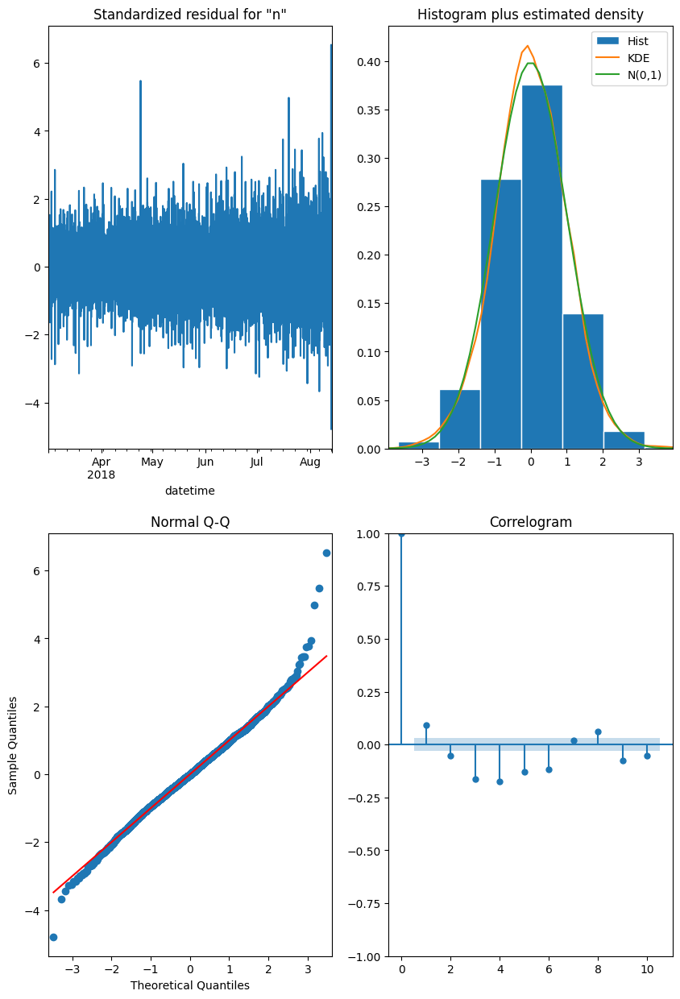

In [73]:
fig=ARIMAmodel0_1_1.plot_diagnostics(figsize=(10, 15))
plt.show()

In [74]:
predict_arima = ARIMAmodel0_1_1.forecast(steps=len(y_test_arima), 
                                                       alpha=0.05, return_conf_int=True)

In [75]:
predict_arima_df = pd.DataFrame(predict_arima)
predict_arima_df.set_index(y_test_arima.index, inplace=True)

In [76]:
predict_arima_df

,predicted_mean
datetime,
2018-08-13 14:00:00,116.934074
2018-08-13 15:00:00,116.934074
2018-08-13 16:00:00,116.934074
2018-08-13 17:00:00,116.934074
2018-08-13 18:00:00,116.934074
...,...
2018-08-31 19:00:00,116.934074
2018-08-31 20:00:00,116.934074
2018-08-31 21:00:00,116.934074


In [77]:
# Plot the actual and predicted values
fig = go.Figure()

# Add the actual values to the chart
fig.add_trace(go.Scatter(x=y_test_arima.index, y=y_test_arima.values,
                    mode='lines',
                    name='Actual'))

# Add the predicted values to the chart
fig.add_trace(go.Scatter(x=predict_arima_df.index, y=predict_arima_df.predicted_mean.values,
                    mode='lines',
                    name='Prediction'))

# Set the chart title, x-axis label, and y-axis label
fig.update_layout(title='Time Series Forecast',
                  xaxis_title='Date',
                  yaxis_title='Value')
fig.update_xaxes(rangeslider_visible=True)
# Show the chart
fig.show()

In [78]:
print("RMSE ARIMA model: ", np.sqrt(mse(y_test_arima, predict_arima_df)))

RMSE ARIMA model:  62.76809456268275


### ARIMA (0, 2, 16)

In [79]:
ARIMAmodel0_2_16 = ARIMA(y_train_arima, order = (0, 2, 16))
ARIMAmodel0_2_16 = ARIMAmodel0_2_16.fit()

In [80]:
ARIMAmodel0_2_16.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:             num_orders   No. Observations:                 3974
Model:                ARIMA(0, 2, 16)   Log Likelihood              -19171.551
Date:                Sun, 30 Apr 2023   AIC                          38377.102
Time:                        12:23:58   BIC                          38483.982
Sample:                    03-01-2018   HQIC                         38415.002
                         - 08-13-2018                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -1.5821      0.014   -110.739      0.000      -1.610      -1.554
ma.L2          0.4452      0.029     15.383      0.000       0.388       0.502
ma.L3         -0.0410      0.034     -1.206      0.228      -0.108       0.026
ma.L4          0.0615      0.034      1.804      0.071      -0.005       0.128
ma.L5          0.0596      0.034      1.775      0.076      -0.006       0.125
ma.L6         -0.0118      0.033     -0.354      0.724      -0.077       0.054
ma.L7          0.1783      0.035      5.085      0.000       0.110       0.247
ma.L8         -0.0373      0.035     -1.067      0.286      -0.106       0.031
ma.L9         -0.1934      0.035     -5.512      0.000      -0.262      -0.125
ma.L10         0.0503      0.037      1.373      0.170      -0.021       0.122
ma.L11         0.0968      0.037      2.619      0.009       0.024       0.169
ma.L12         0.0546      0.036      1.497      0.134      -0.017       0.126
ma.L13         0.0288      0.037      0.783      0.434      -0.043       0.101
ma.L14        -0.1054      0.037     -2.826      0.005      -0.178      -0.032
ma.L15        -0.0651      0.037     -1.759      0.079      -0.138       0.007
ma.L16         0.0611      0.020      3.020      0.003       0.021       0.101
sigma2      1034.4729     18.966     54.545      0.000     997.301    1071.645
===================================================================================
Ljung-Box (L1) (Q):                   0.33   Jarque-Bera (JB):              1443.36
Prob(Q):                              0.56   Prob(JB):                         0.00
Heteroskedasticity (H):               1.75   Skew:                             0.72
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.58
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

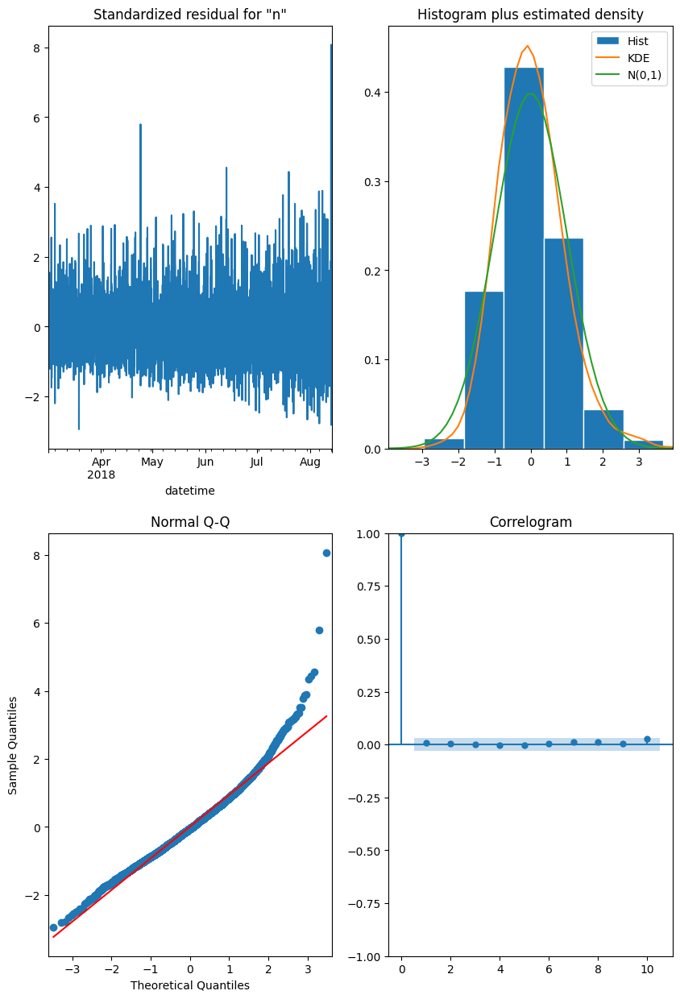

In [81]:
fig=ARIMAmodel0_2_16.plot_diagnostics(figsize=(10, 15))
plt.show()

In [82]:
predict_arima = ARIMAmodel0_2_16.forecast(steps=len(y_test_arima), 
                                                       alpha=0.05, return_conf_int=True)

In [83]:
predict_arima_df = pd.DataFrame(predict_arima)
predict_arima_df.set_index(y_test_arima.index, inplace=True)

In [84]:
predict_arima_df

,predicted_mean
datetime,
2018-08-13 14:00:00,129.583025
2018-08-13 15:00:00,144.731626
2018-08-13 16:00:00,126.514403
2018-08-13 17:00:00,103.937693
2018-08-13 18:00:00,110.436545
...,...
2018-08-31 19:00:00,130.573630
2018-08-31 20:00:00,130.605015
2018-08-31 21:00:00,130.636400


In [85]:
# Plot the actual and predicted values
fig = go.Figure()

# Add the actual values to the chart
fig.add_trace(go.Scatter(x=y_test_arima.index, y=y_test_arima.values,
                    mode='lines',
                    name='Actual'))

# Add the predicted values to the chart
fig.add_trace(go.Scatter(x=predict_arima_df.index, y=predict_arima_df.predicted_mean.values,
                    mode='lines',
                    name='Prediction'))

# Set the chart title, x-axis label, and y-axis label
fig.update_layout(title='Time Series Forecast',
                  xaxis_title='Date',
                  yaxis_title='Value')
fig.update_xaxes(rangeslider_visible=True)
# Show the chart
fig.show()

### ARIMA (2, 0, 0)

In [86]:
ARIMAmodel2_0_0 = ARIMA(y_train_arima, order = (2, 0, 0))
ARIMAmodel2_0_0 = ARIMAmodel2_0_0.fit()

In [87]:
ARIMAmodel2_0_0.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:             num_orders   No. Observations:                 3974
Model:                 ARIMA(2, 0, 0)   Log Likelihood              -19383.463
Date:                Sun, 30 Apr 2023   AIC                          38774.926
Time:                        12:24:00   BIC                          38800.076
Sample:                    03-01-2018   HQIC                         38783.844
                         - 08-13-2018                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         78.2906      1.431     54.698      0.000      75.485      81.096
ar.L1          0.5030      0.012     40.953      0.000       0.479       0.527
ar.L2          0.1069      0.014      7.397      0.000       0.079       0.135
sigma2      1009.5130     17.216     58.638      0.000     975.770    1043.256
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):               883.64
Prob(Q):                              0.88   Prob(JB):                         0.00
Heteroskedasticity (H):               1.85   Skew:                             0.62
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.95
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

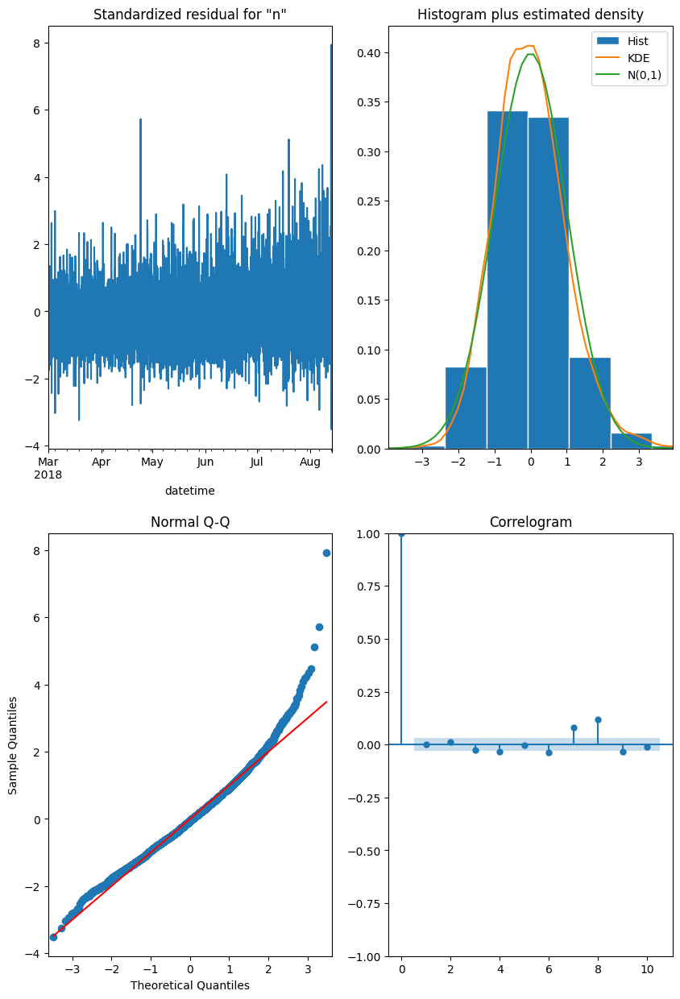

In [88]:
fig=ARIMAmodel2_0_0.plot_diagnostics(figsize=(10, 15))
plt.show()

In [89]:
predict_arima = ARIMAmodel2_0_0.forecast(steps=len(y_test_arima), 
                                                       alpha=0.05, return_conf_int=True)

In [90]:
predict_arima_df = pd.DataFrame(predict_arima)
predict_arima_df.set_index(y_test_arima.index, inplace=True)

In [91]:
predict_arima_df

,predicted_mean
datetime,
2018-08-13 14:00:00,100.230927
2018-08-13 15:00:00,93.676920
2018-08-13 16:00:00,88.374375
2018-08-13 17:00:00,85.006898
2018-08-13 18:00:00,82.746436
...,...
2018-08-31 19:00:00,78.290645
2018-08-31 20:00:00,78.290645
2018-08-31 21:00:00,78.290645


In [92]:
# Plot the actual and predicted values
fig = go.Figure()

# Add the actual values to the chart
fig.add_trace(go.Scatter(x=y_test_arima.index, y=y_test_arima.values,
                    mode='lines',
                    name='Actual'))

# Add the predicted values to the chart
fig.add_trace(go.Scatter(x=predict_arima_df.index, y=predict_arima_df.predicted_mean.values,
                    mode='lines',
                    name='Prediction'))

# Set the chart title, x-axis label, and y-axis label
fig.update_layout(title='Time Series Forecast',
                  xaxis_title='Date',
                  yaxis_title='Value')
fig.update_xaxes(rangeslider_visible=True)
# Show the chart
fig.show()

In [93]:
print("RMSE ARIMA model: ", np.sqrt(mse(y_test_arima, predict_arima_df)))

RMSE ARIMA model:  84.66084499391789


In [94]:
print("RMSE ARIMA model: ", np.sqrt(mse(y_test_arima, predict_arima_df)))

RMSE ARIMA model:  84.66084499391789


### ARIMA (24, 1, 1)

In [95]:
ARIMAmodel24_1_1 = ARIMA(y_train_arima, order = (24, 1, 1))
ARIMAmodel24_1_1 = ARIMAmodel24_1_1.fit()

In [96]:
ARIMAmodel24_1_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:             num_orders   No. Observations:                 3974
Model:                ARIMA(24, 1, 1)   Log Likelihood              -18537.877
Date:                Sun, 30 Apr 2023   AIC                          37127.753
Time:                        12:24:59   BIC                          37291.222
Sample:                    03-01-2018   HQIC                         37185.719
                         - 08-13-2018                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0609      0.048      1.265      0.206      -0.033       0.155
ar.L2         -0.0264      0.035     -0.758      0.449      -0.095       0.042
ar.L3         -0.0905      0.030     -3.040      0.002      -0.149      -0.032
ar.L4         -0.1125      0.030     -3.768      0.000      -0.171      -0.054
ar.L5         -0.1033      0.031     -3.385      0.001      -0.163      -0.043
ar.L6         -0.1432      0.030     -4.786      0.000      -0.202      -0.085
ar.L7         -0.0270      0.033     -0.831      0.406      -0.091       0.037
ar.L8         -0.0124      0.028     -0.441      0.660      -0.067       0.043
ar.L9         -0.1389      0.024     -5.688      0.000      -0.187      -0.091
ar.L10        -0.1168      0.028     -4.241      0.000      -0.171      -0.063
ar.L11        -0.0453      0.030     -1.531      0.126      -0.103       0.013
ar.L12        -0.0433      0.027     -1.623      0.105      -0.096       0.009
ar.L13        -0.0352      0.025     -1.410      0.159      -0.084       0.014
ar.L14        -0.1074      0.024     -4.519      0.000      -0.154      -0.061
ar.L15        -0.1423      0.026     -5.507      0.000      -0.193      -0.092
ar.L16        -0.0331      0.028     -1.178      0.239      -0.088       0.022
ar.L17        -0.0367      0.026     -1.423      0.155      -0.087       0.014
ar.L18        -0.0900      0.023     -3.849      0.000      -0.136      -0.044
ar.L19        -0.1089      0.026     -4.240      0.000      -0.159      -0.059
ar.L20        -0.0981      0.027     -3.658      0.000      -0.151      -0.046
ar.L21        -0.1090      0.028     -3.875      0.000      -0.164      -0.054
ar.L22         0.0052      0.028      0.183      0.855      -0.050       0.061
ar.L23         0.0649      0.024      2.751      0.006       0.019       0.111
ar.L24         0.3874      0.019     20.824      0.000       0.351       0.424
ma.L1         -0.7680      0.049    -15.762      0.000      -0.863      -0.672
sigma2       668.6217     10.601     63.069      0.000     647.843     689.400
===================================================================================
Ljung-Box (L1) (Q):                   2.25   Jarque-Bera (JB):              2354.61
Prob(Q):                              0.13   Prob(JB):                         0.00
Heteroskedasticity (H):               1.94   Skew:                             0.76
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.45
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

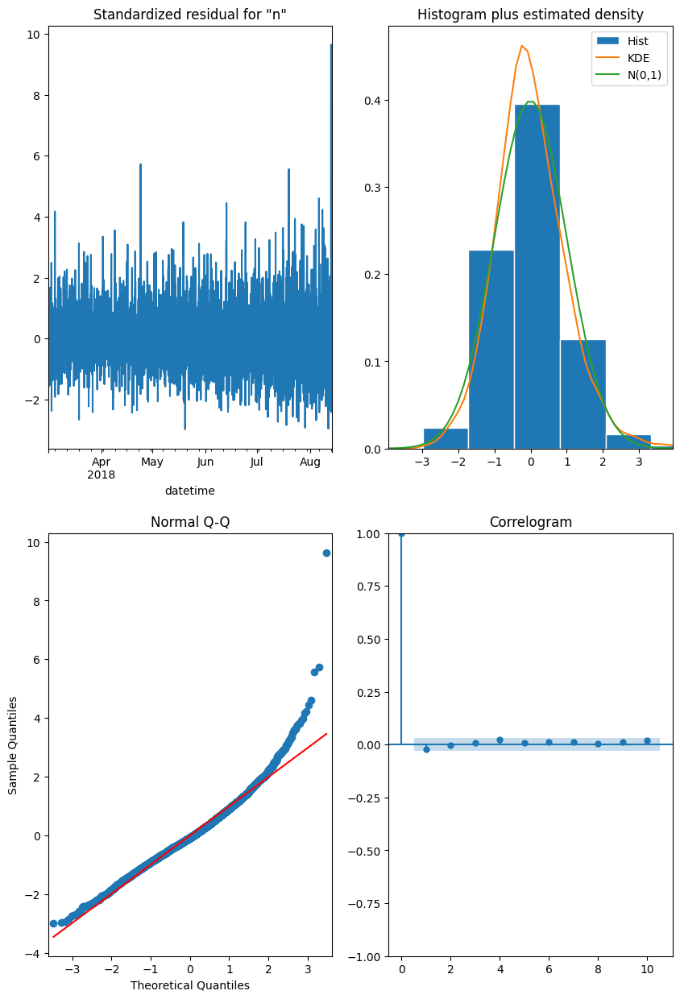

In [97]:
fig=ARIMAmodel24_1_1.plot_diagnostics(figsize=(10, 15))
plt.show()

In [98]:
predict_arima = ARIMAmodel24_1_1.forecast(steps=len(y_test_arima), 
                                                       alpha=0.05, return_conf_int=True)

In [99]:
predict_arima_df = pd.DataFrame(predict_arima)
predict_arima_df.set_index(y_test_arima.index, inplace=True)

In [100]:
predict_arima_df

,predicted_mean
datetime,
2018-08-13 14:00:00,132.043794
2018-08-13 15:00:00,150.834305
2018-08-13 16:00:00,129.742431
2018-08-13 17:00:00,105.999544
2018-08-13 18:00:00,108.288084
...,...
2018-08-31 19:00:00,137.093371
2018-08-31 20:00:00,137.407854
2018-08-31 21:00:00,137.963073


In [101]:
# Plot the actual and predicted values
fig = go.Figure()

# Add the actual values to the chart
fig.add_trace(go.Scatter(x=y_test_arima.index, y=y_test_arima.values,
                    mode='lines',
                    name='Actual'))

# Add the predicted values to the chart
fig.add_trace(go.Scatter(x=predict_arima_df.index, y=predict_arima_df.predicted_mean.values,
                    mode='lines',
                    name='Prediction'))

# Set the chart title, x-axis label, and y-axis label
fig.update_layout(title='Time Series Forecast',
                  xaxis_title='Date',
                  yaxis_title='Value')

# Show the chart
fig.show()

In [102]:
print("RMSE ARIMA model: ", np.sqrt(mse(y_test_arima, predict_arima_df)))

RMSE ARIMA model:  55.53543527967754


### ARIMA (24, 2, 12)

In [103]:
ARIMAmodel24_2_12 = ARIMA(y_train_arima, order = (24, 2, 12))
ARIMAmodel24_2_12 = ARIMAmodel24_2_12.fit()

In [104]:
ARIMAmodel24_2_12.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:             num_orders   No. Observations:                 3974
Model:               ARIMA(24, 2, 12)   Log Likelihood              -18534.356
Date:                Sun, 30 Apr 2023   AIC                          37142.712
Time:                        12:26:55   BIC                          37375.332
Sample:                    03-01-2018   HQIC                         37225.200
                         - 08-13-2018                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.4277      0.154     -9.249      0.000      -1.730      -1.125
ar.L2         -1.1795      0.118    -10.035      0.000      -1.410      -0.949
ar.L3         -1.2109      0.101    -11.948      0.000      -1.410      -1.012
ar.L4         -1.2766      0.120    -10.655      0.000      -1.511      -1.042
ar.L5         -1.2126      0.127     -9.569      0.000      -1.461      -0.964
ar.L6         -1.3533      0.100    -13.473      0.000      -1.550      -1.156
ar.L7         -1.2956      0.147     -8.838      0.000      -1.583      -1.008
ar.L8         -1.1782      0.116    -10.186      0.000      -1.405      -0.951
ar.L9         -1.2321      0.109    -11.296      0.000      -1.446      -1.018
ar.L10        -1.2184      0.124     -9.793      0.000      -1.462      -0.975
ar.L11        -1.2338      0.120    -10.259      0.000      -1.470      -0.998
ar.L12        -1.1199      0.105    -10.690      0.000      -1.325      -0.915
ar.L13        -1.0339      0.103    -10.065      0.000      -1.235      -0.833
ar.L14        -1.0172      0.094    -10.777      0.000      -1.202      -0.832
ar.L15        -1.0989      0.094    -11.674      0.000      -1.283      -0.914
ar.L16        -1.0634      0.104    -10.179      0.000      -1.268      -0.859
ar.L17        -0.9920      0.093    -10.626      0.000      -1.175      -0.809
ar.L18        -0.9989      0.085    -11.770      0.000      -1.165      -0.833
ar.L19        -1.0296      0.089    -11.506      0.000      -1.205      -0.854
ar.L20        -1.0603      0.093    -11.365      0.000      -1.243      -0.877
ar.L21        -1.1064      0.091    -12.099      0.000      -1.286      -0.927
ar.L22        -1.0313      0.099    -10.454      0.000      -1.225      -0.838
ar.L23        -0.8266      0.083     -9.937      0.000      -0.990      -0.664
ar.L24        -0.3184      0.060     -5.318      0.000      -0.436      -0.201
ma.L1         -0.2900      0.154     -1.882      0.060      -0.592       0.012
ma.L2         -0.6294      0.170     -3.705      0.000      -0.962      -0.296
ma.L3          0.1216      0.081      1.508      0.132      -0.036       0.280
ma.L4         -0.0016      0.078     -0.021      0.983      -0.155       0.152
ma.L5         -0.1506      0.080     -1.892      0.058      -0.307       0.005
ma.L6          0.1460      0.078      1.869      0.062      -0.007       0.299
ma.L7         -0.0932      0.093     -1.007      0.314      -0.275       0.088
ma.L8          0.0047      0.098      0.048      0.962      -0.187       0.197
ma.L9          0.0148      0.084      0.177      0.860      -0.149       0.179
ma.L10        -0.1208      0.061     -1.981      0.048      -0.240      -0.001
ma.L11         0.1317      0.063      2.096      0.036       0.009       0.255
ma.L12        -0.1253      0.044     -2.829      0.005      -0.212      -0.038
sigma2       685.0414     11.654     58.784      0.000     662.201     707.882
=================================================================================

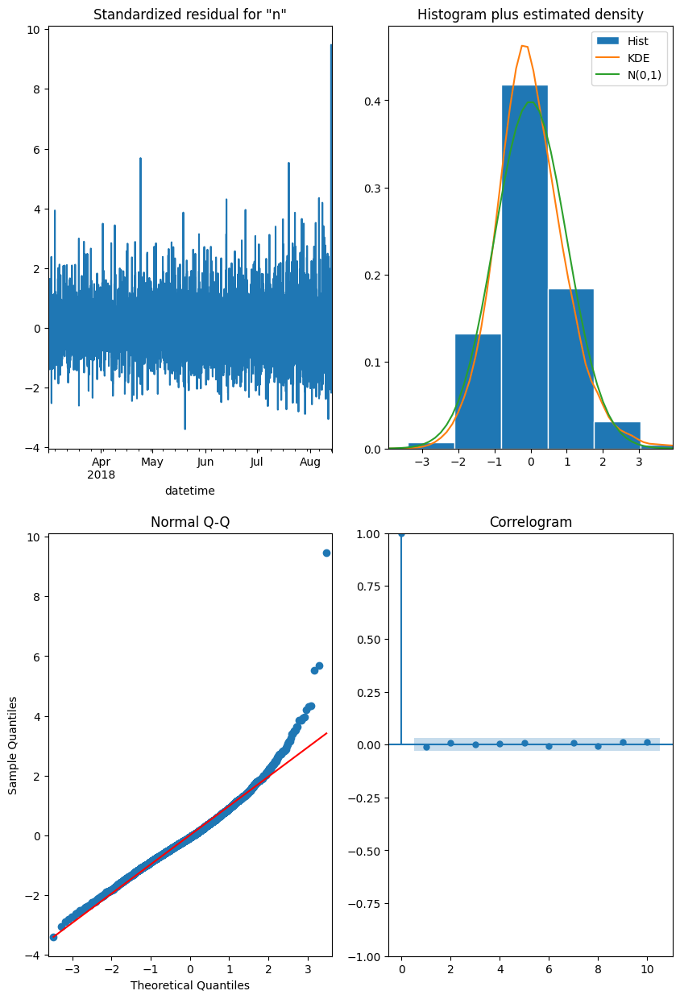

In [105]:
fig=ARIMAmodel24_2_12.plot_diagnostics(figsize=(10, 15))
plt.show()

In [106]:
predict_arima = ARIMAmodel24_2_12.forecast(steps=len(y_test_arima), 
                                                       alpha=0.05, return_conf_int=True)

In [107]:
predict_arima_df = pd.DataFrame(predict_arima)
predict_arima_df.set_index(y_test_arima.index, inplace=True)

In [108]:
predict_arima_df

,predicted_mean
datetime,
2018-08-13 14:00:00,130.193329
2018-08-13 15:00:00,150.685201
2018-08-13 16:00:00,123.206060
2018-08-13 17:00:00,105.703402
2018-08-13 18:00:00,101.013874
...,...
2018-08-31 19:00:00,154.675289
2018-08-31 20:00:00,157.193831
2018-08-31 21:00:00,163.419306


In [109]:
# Plot the actual and predicted values
fig = go.Figure()

# Add the actual values to the chart
fig.add_trace(go.Scatter(x=y_test_arima.index, y=y_test_arima.values,
                    mode='lines',
                    name='Actual'))

# Add the predicted values to the chart
fig.add_trace(go.Scatter(x=predict_arima_df.index, y=predict_arima_df.predicted_mean.values,
                    mode='lines',
                    name='Prediction'))

# Set the chart title, x-axis label, and y-axis label
fig.update_layout(title='Time Series Forecast',
                  xaxis_title='Date',
                  yaxis_title='Value')

# Show the chart
fig.show()

In [110]:
print("RMSE ARIMA model: ", np.sqrt(mse(y_test_arima, predict_arima_df)))

RMSE ARIMA model:  53.8469747252361


### ARIMA (25, 2, 27)

In [111]:
ARIMAmodel25_2_27 = ARIMA(y_train_arima, order = (25, 2, 27))
ARIMAmodel25_2_27 = ARIMAmodel25_2_27.fit()

In [112]:
ARIMAmodel25_2_27.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:             num_orders   No. Observations:                 3974
Model:               ARIMA(25, 2, 27)   Log Likelihood              -18176.699
Date:                Sun, 30 Apr 2023   AIC                          36459.397
Time:                        12:31:43   BIC                          36792.609
Sample:                    03-01-2018   HQIC                         36577.554
                         - 08-13-2018                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -2.0679      0.188    -10.999      0.000      -2.436      -1.699
ar.L2         -2.7783      0.361     -7.698      0.000      -3.486      -2.071
ar.L3         -2.8016      0.372     -7.529      0.000      -3.531      -2.072
ar.L4         -2.6349      0.350     -7.522      0.000      -3.322      -1.948
ar.L5         -2.5508      0.329     -7.755      0.000      -3.195      -1.906
ar.L6         -2.6251      0.326     -8.046      0.000      -3.265      -1.986
ar.L7         -2.7999      0.345     -8.108      0.000      -3.477      -2.123
ar.L8         -2.7754      0.371     -7.486      0.000      -3.502      -2.049
ar.L9         -2.6174      0.359     -7.288      0.000      -3.321      -1.914
ar.L10        -2.5351      0.318     -7.975      0.000      -3.158      -1.912
ar.L11        -2.6579      0.322     -8.242      0.000      -3.290      -2.026
ar.L12        -2.8021      0.360     -7.792      0.000      -3.507      -2.097
ar.L13        -2.7530      0.367     -7.497      0.000      -3.473      -2.033
ar.L14        -2.5720      0.346     -7.429      0.000      -3.251      -1.893
ar.L15        -2.5493      0.321     -7.952      0.000      -3.178      -1.921
ar.L16        -2.7052      0.326     -8.293      0.000      -3.345      -2.066
ar.L17        -2.7749      0.364     -7.618      0.000      -3.489      -2.061
ar.L18        -2.7160      0.364     -7.463      0.000      -3.429      -2.003
ar.L19        -2.5552      0.336     -7.616      0.000      -3.213      -1.898
ar.L20        -2.5556      0.322     -7.932      0.000      -3.187      -1.924
ar.L21        -2.7154      0.331     -8.192      0.000      -3.365      -2.066
ar.L22        -2.8491      0.362     -7.866      0.000      -3.559      -2.139
ar.L23        -2.6246      0.375     -6.996      0.000      -3.360      -1.889
ar.L24        -1.5356      0.325     -4.723      0.000      -2.173      -0.898
ar.L25        -0.5652      0.151     -3.750      0.000      -0.861      -0.270
ma.L1          0.1425      0.185      0.769      0.442      -0.221       0.506
ma.L2         -0.2880      0.139     -2.067      0.039      -0.561      -0.015
ma.L3         -0.6609      0.174     -3.787      0.000      -1.003      -0.319
ma.L4         -0.1998      0.061     -3.273      0.001      -0.319      -0.080
ma.L5          0.1026      0.042      2.429      0.015       0.020       0.185
ma.L6          0.1150      0.047      2.427      0.015       0.022       0.208
ma.L7          0.0911      0.044      2.061      0.039       0.004       0.178
ma.L8         -0.1575      0.043     -3.672      0.000      -0.242      -0.073
ma.L9         -0.1519      0.050     -3.051      0.002      -0.249      -0.054
ma.L10         0.0519      0.053      0.979      0.328      -0.052       0.156
ma.L11         0.2083      0.056      3.690      0.000       0.098       0.319
ma.L12         0.0498      0.059      0.838      0.402      -0.067       0.166
ma.L13        -0.1584      0.047     -3.361      0.001      -0.251      -0.066
ma

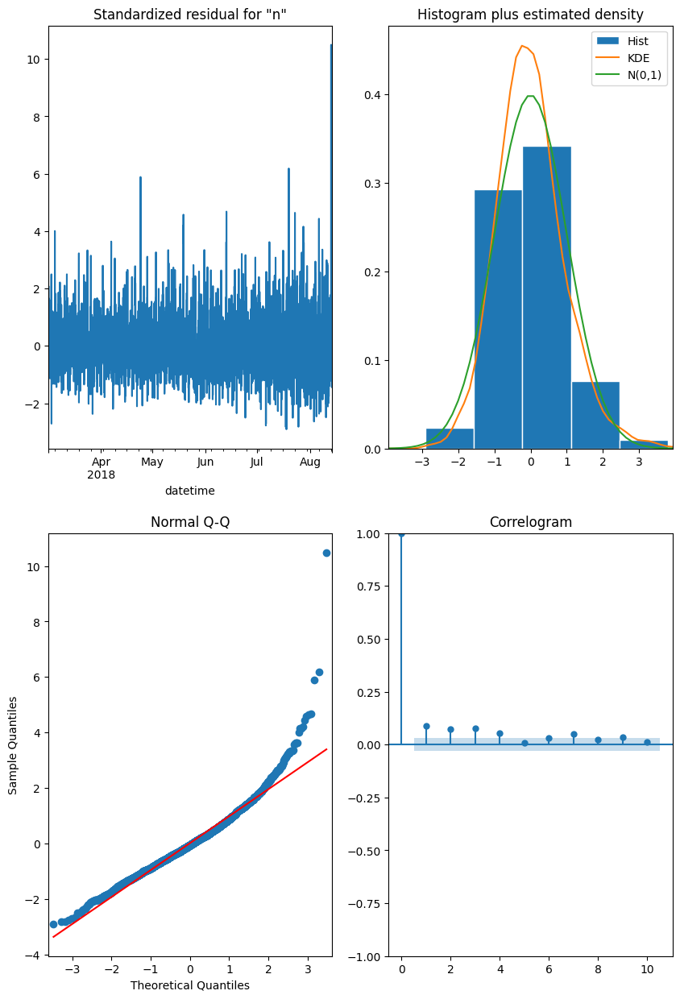

In [113]:
fig=ARIMAmodel25_2_27.plot_diagnostics(figsize=(10, 15))
plt.show()

In [114]:
predict_arima = ARIMAmodel25_2_27.forecast(steps=len(y_test_arima), 
                                                       alpha=0.05, return_conf_int=True)

In [115]:
predict_arima_df = pd.DataFrame(predict_arima)
predict_arima_df.set_index(y_test_arima.index, inplace=True)

In [116]:
# Plot the actual and predicted values
fig = go.Figure()

# Add the actual values to the chart
fig.add_trace(go.Scatter(x=y_test_arima.index, y=y_test_arima.values,
                    mode='lines',
                    name='Actual'))

# Add the predicted values to the chart
fig.add_trace(go.Scatter(x=predict_arima_df.index, y=predict_arima_df.predicted_mean.values,
                    mode='lines',
                    name='Prediction'))

# Set the chart title, x-axis label, and y-axis label
fig.update_layout(title='Time Series Forecast',
                  xaxis_title='Date',
                  yaxis_title='Value')
fig.update_xaxes(rangeslider_visible=True)
# Show the chart
fig.show()

In [117]:
print("RMSE ARIMA model: ", np.sqrt(mse(y_test_arima, predict_arima_df)))

RMSE ARIMA model:  44.367983591902174


### ARIMA (25, 2, 36)

In [118]:
ARIMAmodel25_2_36 = ARIMA(y_train_arima, order = (25, 2, 36))
ARIMAmodel25_2_36 = ARIMAmodel25_2_36.fit()

In [119]:
ARIMAmodel25_2_36.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:             num_orders   No. Observations:                 3974
Model:               ARIMA(25, 2, 36)   Log Likelihood              -18153.594
Date:                Sun, 30 Apr 2023   AIC                          36431.187
Time:                        12:41:32   BIC                          36820.983
Sample:                    03-01-2018   HQIC                         36569.409
                         - 08-13-2018                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.8397      0.319     -5.761      0.000      -2.466      -1.214
ar.L2         -2.3329      0.555     -4.201      0.000      -3.421      -1.244
ar.L3         -2.3422      0.478     -4.897      0.000      -3.280      -1.405
ar.L4         -2.2908      0.470     -4.878      0.000      -3.211      -1.370
ar.L5         -2.3599      0.524     -4.504      0.000      -3.387      -1.333
ar.L6         -2.3249      0.492     -4.728      0.000      -3.289      -1.361
ar.L7         -2.3266      0.481     -4.833      0.000      -3.270      -1.383
ar.L8         -2.3104      0.503     -4.597      0.000      -3.295      -1.325
ar.L9         -2.3542      0.497     -4.735      0.000      -3.329      -1.380
ar.L10        -2.2963      0.486     -4.726      0.000      -3.249      -1.344
ar.L11        -2.3240      0.491     -4.735      0.000      -3.286      -1.362
ar.L12        -2.3336      0.499     -4.677      0.000      -3.312      -1.356
ar.L13        -2.3326      0.494     -4.721      0.000      -3.301      -1.364
ar.L14        -2.3348      0.487     -4.790      0.000      -3.290      -1.379
ar.L15        -2.3028      0.504     -4.572      0.000      -3.290      -1.316
ar.L16        -2.3456      0.486     -4.822      0.000      -3.299      -1.392
ar.L17        -2.3090      0.490     -4.714      0.000      -3.269      -1.349
ar.L18        -2.3612      0.502     -4.699      0.000      -3.346      -1.376
ar.L19        -2.3090      0.493     -4.686      0.000      -3.275      -1.343
ar.L20        -2.2939      0.492     -4.662      0.000      -3.258      -1.329
ar.L21        -2.3405      0.481     -4.867      0.000      -3.283      -1.398
ar.L22        -2.4056      0.500     -4.813      0.000      -3.385      -1.426
ar.L23        -2.2269      0.523     -4.260      0.000      -3.252      -1.202
ar.L24        -1.3273      0.459     -2.889      0.004      -2.228      -0.427
ar.L25        -0.5493      0.231     -2.374      0.018      -1.003      -0.096
ma.L1         -0.0340      0.318     -0.107      0.915      -0.658       0.590
ma.L2         -0.2426      0.316     -0.768      0.443      -0.862       0.377
ma.L3         -0.4083      0.345     -1.183      0.237      -1.085       0.268
ma.L4         -0.0624      0.149     -0.417      0.676      -0.355       0.231
ma.L5          0.0577      0.153      0.377      0.707      -0.242       0.358
ma.L6         -0.1499      0.128     -1.173      0.241      -0.400       0.101
ma.L7          0.0512      0.078      0.659      0.510      -0.101       0.204
ma.L8          0.0623      0.084      0.745      0.456      -0.101       0.226
ma.L9          0.0199      0.076      0.260      0.795      -0.130       0.170
ma.L10        -0.1559      0.068     -2.292      0.022      -0.289      -0.023
ma.L11         0.1115      0.054      2.047      0.041       0.005       0.218
ma.L12        -0.0045      0.068     -0.066      0.947      -0.138       0.129
ma.L13        -0.0173      0.069     -0.250      0.803      -0.154       0.119
ma

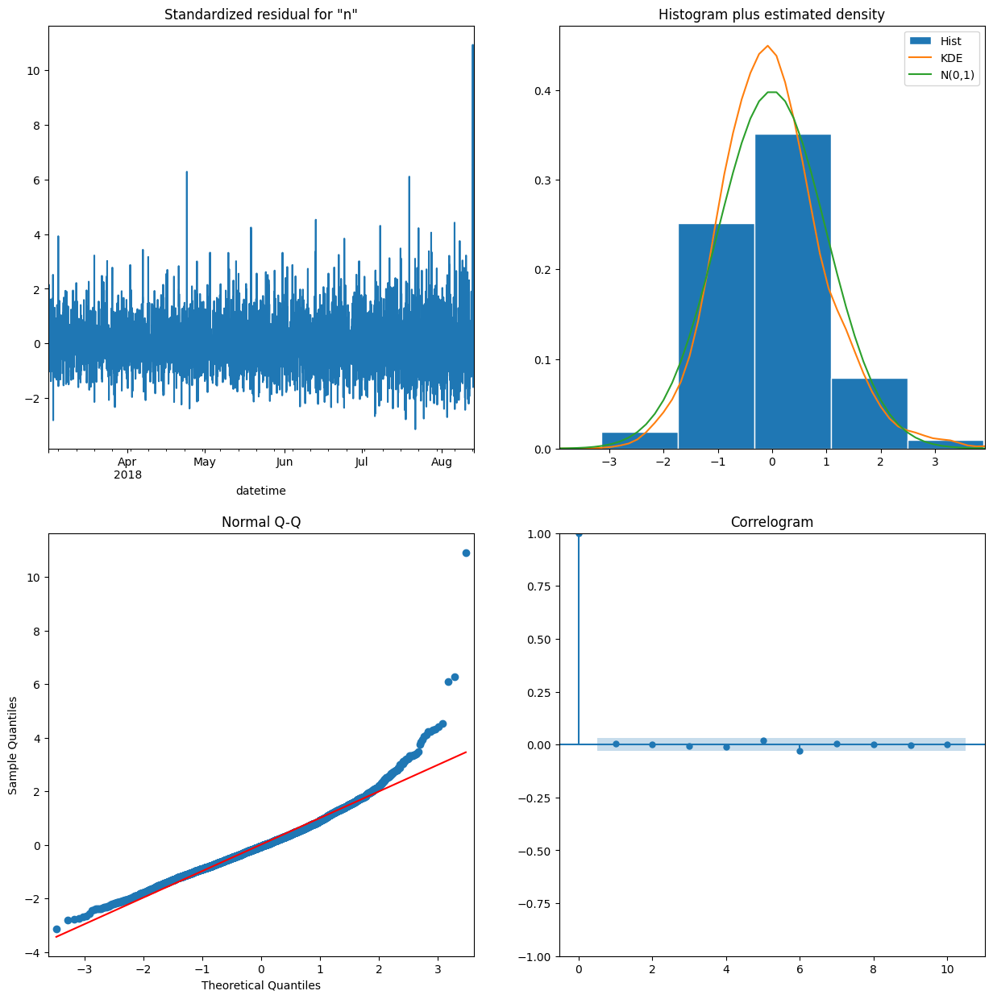

In [120]:
fig=ARIMAmodel25_2_36.plot_diagnostics(figsize=(15, 15))
plt.show()

In [121]:
predict_arima = ARIMAmodel25_2_36.forecast(steps=len(y_test_arima), 
                                                       alpha=0.05, return_conf_int=True)

In [122]:
predict_arima_df = pd.DataFrame(predict_arima)
predict_arima_df.set_index(y_test_arima.index, inplace=True)

In [123]:
# Plot the actual and predicted values
fig = go.Figure()

# Add the actual values to the chart
fig.add_trace(go.Scatter(x=y_test_arima.index, y=y_test_arima.values,
                    mode='lines',
                    name='Actual'))

# Add the predicted values to the chart
fig.add_trace(go.Scatter(x=predict_arima_df.index, y=predict_arima_df.predicted_mean.values,
                    mode='lines',
                    name='Prediction'))

# Set the chart title, x-axis label, and y-axis label
fig.update_layout(title='Time Series Forecast',
                  xaxis_title='Date',
                  yaxis_title='Value')
fig.update_xaxes(rangeslider_visible=True)
# Show the chart
fig.show()

In [124]:
print("RMSE ARIMA model: ", np.sqrt(mse(y_test_arima, predict_arima_df)))

RMSE ARIMA model:  43.43303851060294


## SARIMA

### SARIMA (0,1,1) (0,1,1,24)

In [125]:
# Create a SARIMA model
SARIMAmodel = SARIMAX(y_train_arima, order=(0,1,1), seasonal_order=(0,1,1,24))

# Fit the model
SARIMAmodel = SARIMAmodel.fit(maxiter=50)

# Print the results summary
SARIMAmodel.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                         num_orders   No. Observations:                 3974
Model:             SARIMAX(0, 1, 1)x(0, 1, 1, 24)   Log Likelihood              -17860.707
Date:                            Sun, 30 Apr 2023   AIC                          35727.414
Time:                                    12:41:56   BIC                          35746.258
Sample:                                03-01-2018   HQIC                         35734.098
                                     - 08-13-2018                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.8591      0.007   -127.122      0.000      -0.872      -0.846
ma.S.L24      -0.9078      0.007   -134.004      0.000      -0.921      -0.895
sigma2       491.2259      5.928     82.866      0.000     479.607     502.844
===================================================================================
Ljung-Box (L1) (Q):                  11.00   Jarque-Bera (JB):              6559.21
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               1.96   Skew:                             1.00
Prob(H) (two-sided):                  0.00   Kurtosis:                         8.99
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [126]:
# Create ARIMA mean forecast
arima_pred = ARIMAmodel25_2_36.get_forecast(steps=len(y_test_arima))
arima_mean = arima_pred.predicted_mean

# Create SARIMA mean forecast
sarima_pred = SARIMAmodel.get_forecast(steps=len(y_test_arima))
sarima_mean = sarima_pred.predicted_mean

# Create traces
observed_trace = go.Scatter(x=y_test_arima.index, y=y_test_arima, name='observed')
arima_trace = go.Scatter(x=y_test_arima.index, y=arima_mean, name='ARIMA')
sarima_trace = go.Scatter(x=y_test_arima.index, y=sarima_mean, name='SARIMA')

# Create layout
layout = go.Layout(title='ARIMA and SARIMA Mean Predictions and Observed', xaxis=dict(title='Date'), yaxis=dict(title='Value'))

# Combine traces and layout and create figure
fig = go.Figure(data=[observed_trace, arima_trace, sarima_trace], layout=layout)
fig.update_xaxes(rangeslider_visible=True)
# Show the figure
fig.show()

In [127]:
print("RMSE ARIMA model: ", np.sqrt(mse(y_test_arima, arima_mean)))
print("RMSE SARIMA model: ", np.sqrt(mse(y_test_arima, sarima_mean)))

RMSE ARIMA model:  43.43303851060294
RMSE SARIMA model:  45.304838443164286


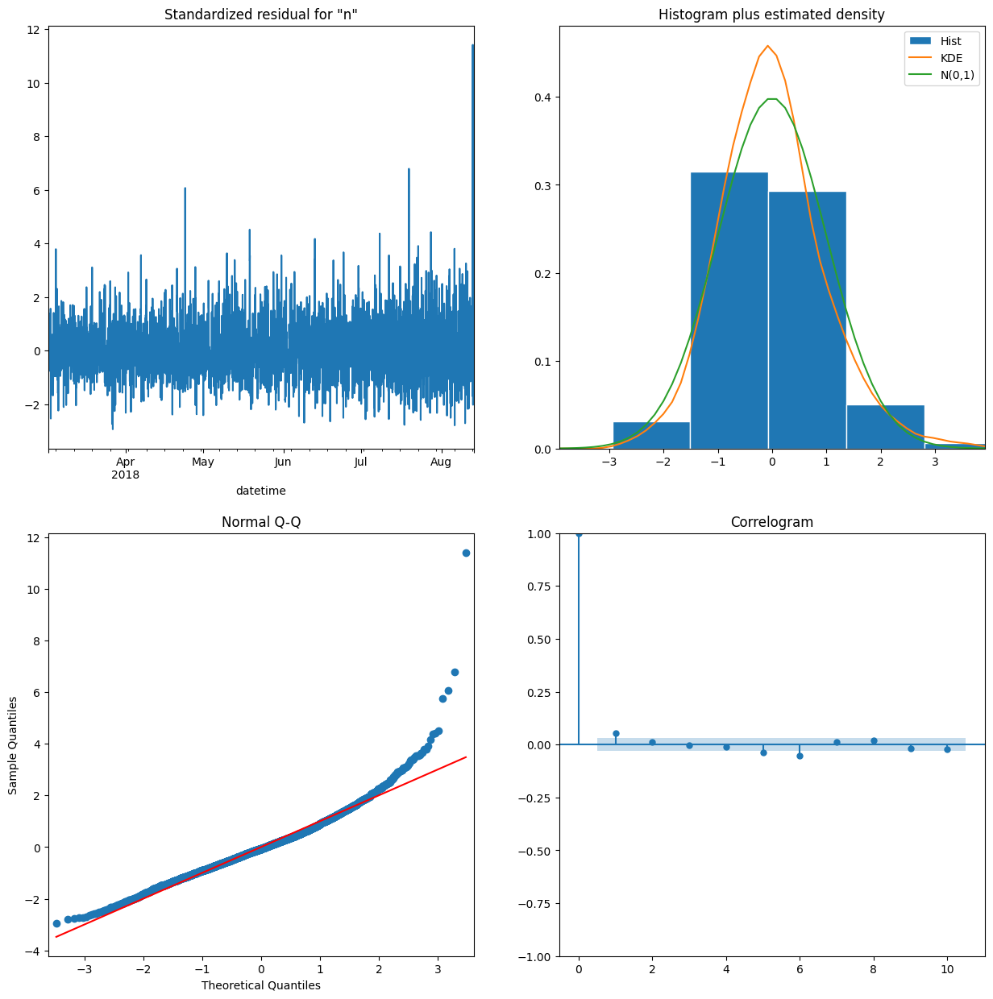

In [128]:
fig=SARIMAmodel.plot_diagnostics(figsize=(15, 15))
plt.show()

### SARIMA (1,1,0) (0,1,1,24)

In [129]:
# Create a SARIMA model
SARIMAmodel2 = SARIMAX(y_train_arima, order=(1,1,0), seasonal_order=(0,1,1,24))

# Fit the model
SARIMAmodel2 = SARIMAmodel2.fit(maxiter=50)

# Print the results summary
SARIMAmodel2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                           num_orders   No. Observations:                 3974
Model:             SARIMAX(1, 1, 0)x(0, 1, [1], 24)   Log Likelihood              -18346.588
Date:                              Sun, 30 Apr 2023   AIC                          36699.175
Time:                                      12:42:16   BIC                          36718.019
Sample:                                  03-01-2018   HQIC                         36705.859
                                       - 08-13-2018                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4731      0.009    -55.552      0.000      -0.490      -0.456
ma.S.L24      -0.9043      0.007   -132.862      0.000      -0.918      -0.891
sigma2       628.6006      8.692     72.316      0.000     611.564     645.637
===================================================================================
Ljung-Box (L1) (Q):                  81.19   Jarque-Bera (JB):              2039.49
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               2.13   Skew:                             0.38
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.44
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [130]:
# Create ARIMA mean forecast
arima_pred = ARIMAmodel25_2_36.get_forecast(steps=len(y_test_arima))
arima_mean = arima_pred.predicted_mean

# Create SARIMA mean forecast
sarima_pred = SARIMAmodel2.get_forecast(steps=len(y_test_arima))
sarima_mean = sarima_pred.predicted_mean

# Create traces
observed_trace = go.Scatter(x=y_test_arima.index, y=y_test_arima, name='observed')
arima_trace = go.Scatter(x=y_test_arima.index, y=arima_mean, name='ARIMA')
sarima_trace = go.Scatter(x=y_test_arima.index, y=sarima_mean, name='SARIMA')

# Create layout
layout = go.Layout(title='ARIMA and SARIMA Mean Predictions and Observed', xaxis=dict(title='Date'), yaxis=dict(title='Value'))

# Combine traces and layout and create figure
fig = go.Figure(data=[observed_trace, arima_trace, sarima_trace], layout=layout)
fig.update_xaxes(rangeslider_visible=True)
# Show the figure
fig.show()

In [131]:
print("RMSE ARIMA model: ", np.sqrt(mse(y_test_arima, arima_mean)))
print("RMSE SARIMA model: ", np.sqrt(mse(y_test_arima, sarima_mean)))

RMSE ARIMA model:  43.43303851060294
RMSE SARIMA model:  39.52301434550343


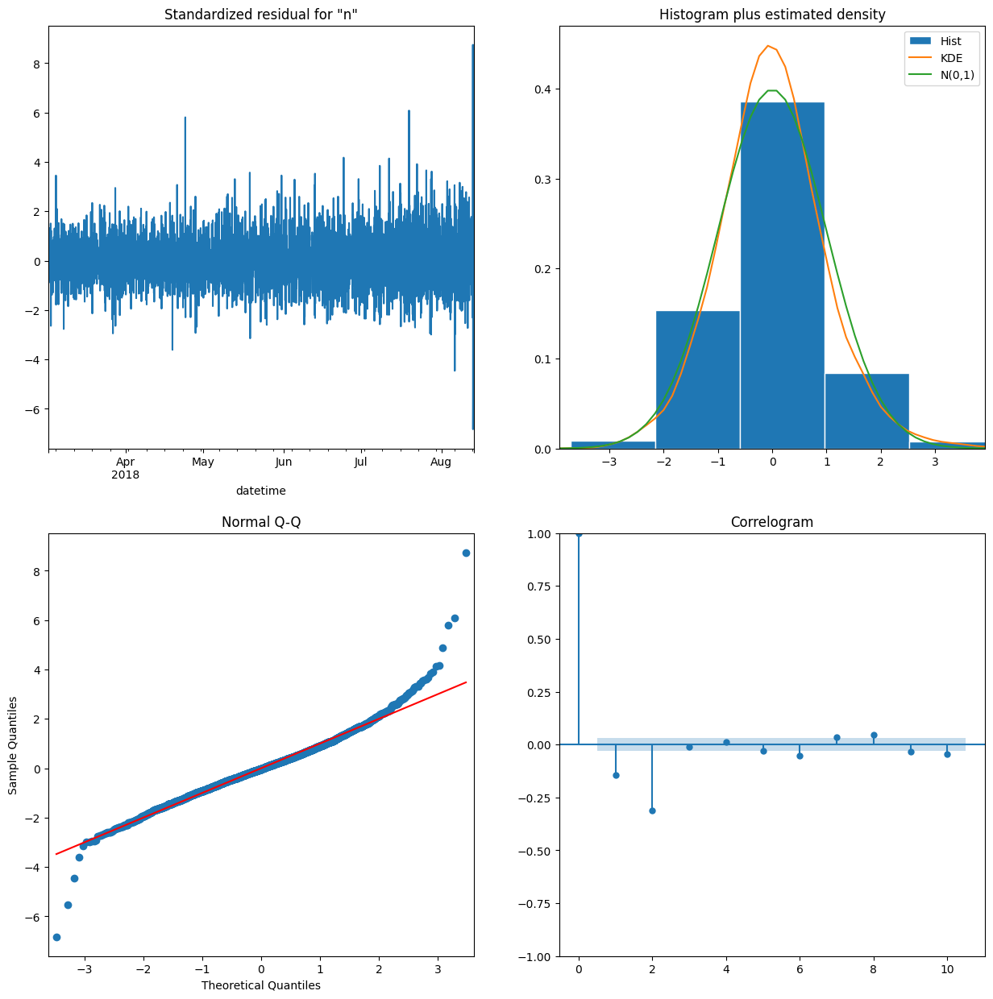

In [132]:
fig=SARIMAmodel2.plot_diagnostics(figsize=(15, 15))
plt.show()

### SARIMA (1,1,0) (0,1,2,24)

In [133]:
# Create a SARIMA model
SARIMAmodel3 = SARIMAX(y_train_arima, order=(1,1,0), seasonal_order=(0,1,2,24))

# Fit the model
SARIMAmodel3 = SARIMAmodel3.fit(maxiter=50)

# Print the results summary
SARIMAmodel3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                        SARIMAX Results                                        
===============================================================================================
Dep. Variable:                              num_orders   No. Observations:                 3974
Model:             SARIMAX(1, 1, 0)x(0, 1, [1, 2], 24)   Log Likelihood              -18340.081
Date:                                 Sun, 30 Apr 2023   AIC                          36688.162
Time:                                         12:43:16   BIC                          36713.286
Sample:                                     03-01-2018   HQIC                         36697.073
                                          - 08-13-2018                                         
Covariance Type:                                   opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4735      0.008    -55.738      0.000      -0.490      -0.457
ma.S.L24      -0.9593      0.015    -62.608      0.000      -0.989      -0.929
ma.S.L48       0.0612      0.015      3.991      0.000       0.031       0.091
sigma2       626.5115      8.688     72.108      0.000     609.482     643.541
===================================================================================
Ljung-Box (L1) (Q):                  80.96   Jarque-Bera (JB):              2028.20
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               2.12   Skew:                             0.38
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.43
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [134]:
# Create ARIMA mean forecast
arima_pred = ARIMAmodel25_2_36.get_forecast(steps=len(y_test_arima))
arima_mean = arima_pred.predicted_mean

# Create SARIMA mean forecast
sarima_pred = SARIMAmodel3.get_forecast(steps=len(y_test_arima))
sarima_mean = sarima_pred.predicted_mean

# Create traces
observed_trace = go.Scatter(x=y_test_arima.index, y=y_test_arima, name='observed')
arima_trace = go.Scatter(x=y_test_arima.index, y=arima_mean, name='ARIMA')
sarima_trace = go.Scatter(x=y_test_arima.index, y=sarima_mean, name='SARIMA')

# Create layout
layout = go.Layout(title='ARIMA and SARIMA Mean Predictions and Observed', xaxis=dict(title='Date'), yaxis=dict(title='Value'))

# Combine traces and layout and create figure
fig = go.Figure(data=[observed_trace, arima_trace, sarima_trace], layout=layout)
fig.update_xaxes(rangeslider_visible=True)
# Show the figure
fig.show()

In [135]:
print("RMSE ARIMA model: ", np.sqrt(mse(y_test_arima, arima_mean)))
print("RMSE SARIMA model: ", np.sqrt(mse(y_test_arima, sarima_mean)))

RMSE ARIMA model:  43.43303851060294
RMSE SARIMA model:  39.816476140294206


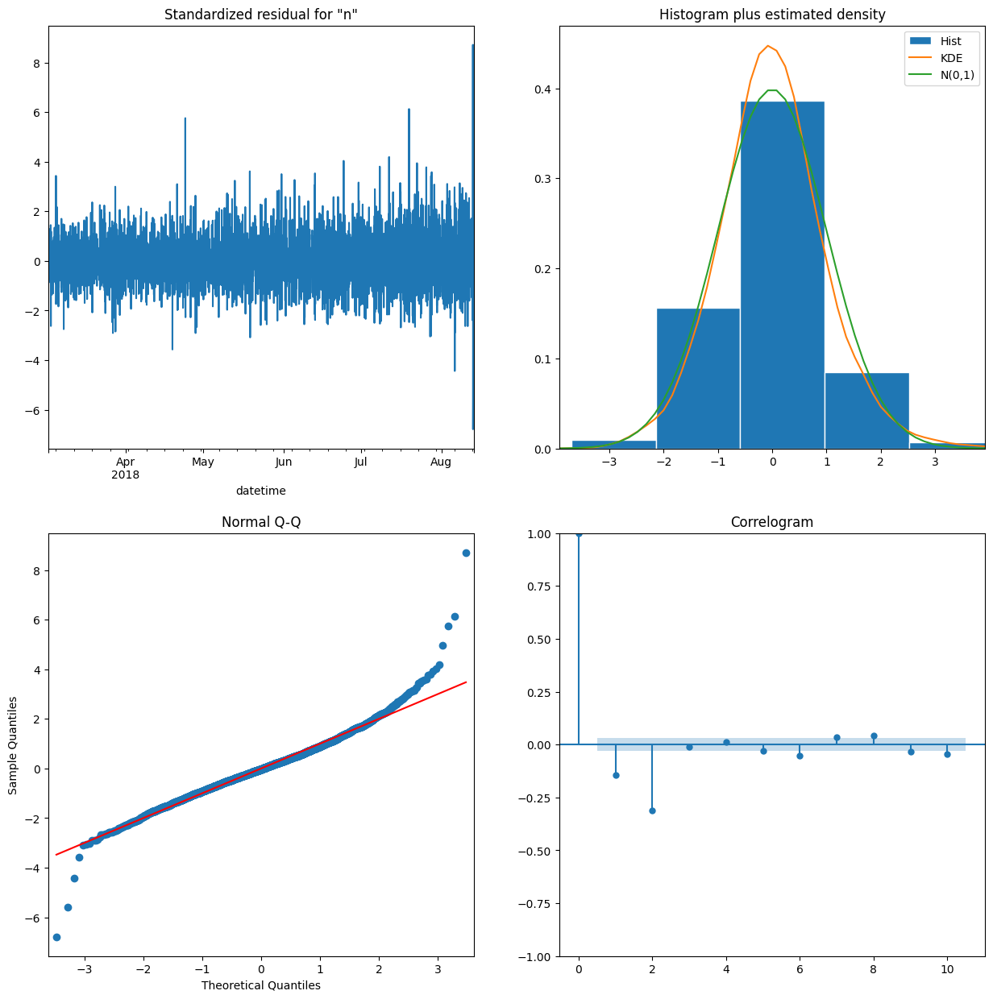

In [136]:
fig=SARIMAmodel3.plot_diagnostics(figsize=(15, 15))
plt.show()

### SARIMA (2,1,0) (0,1,1,24)

In [137]:
# Create a SARIMA model
SARIMAmodel4 = SARIMAX(y_train_arima, order=(2,1,0), seasonal_order=(0,1,1,24))

# Fit the model
SARIMAmodel4 = SARIMAmodel4.fit(maxiter=50)

# Print the results summary
SARIMAmodel4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                           num_orders   No. Observations:                 3974
Model:             SARIMAX(2, 1, 0)x(0, 1, [1], 24)   Log Likelihood              -18155.462
Date:                              Sun, 30 Apr 2023   AIC                          36318.924
Time:                                      12:43:44   BIC                          36344.049
Sample:                                  03-01-2018   HQIC                         36327.836
                                       - 08-13-2018                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6165      0.010    -62.838      0.000      -0.636      -0.597
ar.L2         -0.3039      0.011    -27.566      0.000      -0.326      -0.282
ma.S.L24      -0.9057      0.007   -130.845      0.000      -0.919      -0.892
sigma2       570.5178      7.923     72.012      0.000     554.990     586.046
===================================================================================
Ljung-Box (L1) (Q):                  17.70   Jarque-Bera (JB):              2424.85
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               2.16   Skew:                             0.59
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.66
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [138]:
# Create ARIMA mean forecast
arima_pred = ARIMAmodel25_2_36.get_forecast(steps=len(y_test_arima))
arima_mean = arima_pred.predicted_mean

# Create SARIMA mean forecast
sarima_pred = SARIMAmodel4.get_forecast(steps=len(y_test_arima))
sarima_mean = sarima_pred.predicted_mean

# Create traces
observed_trace = go.Scatter(x=y_test_arima.index, y=y_test_arima, name='observed')
arima_trace = go.Scatter(x=y_test_arima.index, y=arima_mean, name='ARIMA')
sarima_trace = go.Scatter(x=y_test_arima.index, y=sarima_mean, name='SARIMA')

# Create layout
layout = go.Layout(title='ARIMA and SARIMA Mean Predictions and Observed', xaxis=dict(title='Date'), yaxis=dict(title='Value'))

# Combine traces and layout and create figure
fig = go.Figure(data=[observed_trace, arima_trace, sarima_trace], layout=layout)
fig.update_xaxes(rangeslider_visible=True)
# Show the figure
fig.show()

In [139]:
print("RMSE ARIMA model: ", np.sqrt(mse(y_test_arima, arima_mean)))
print("RMSE SARIMA model: ", np.sqrt(mse(y_test_arima, sarima_mean)))

RMSE ARIMA model:  43.43303851060294
RMSE SARIMA model:  40.22533357920624


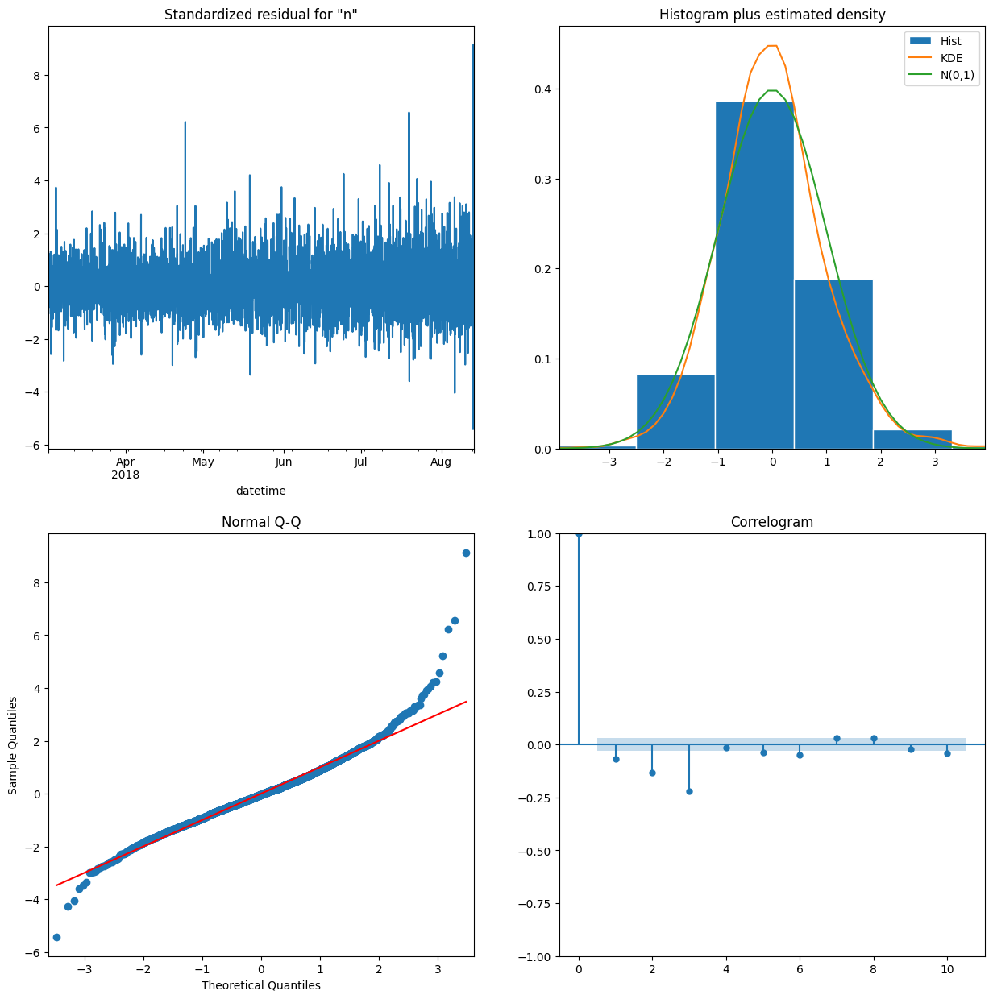

In [140]:
fig=SARIMAmodel4.plot_diagnostics(figsize=(15, 15))
plt.show()

### SARIMA (0,1,2) (0,1,2,24)

In [141]:
# Create a SARIMA model
SARIMAmodel5 = SARIMAX(y_train_arima, order=(0,1,2), seasonal_order=(0,1,2,24))

# Fit the model
SARIMAmodel5 = SARIMAmodel5.fit(maxiter=50)

# Print the results summary
SARIMAmodel5.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                         num_orders   No. Observations:                 3974
Model:             SARIMAX(0, 1, 2)x(0, 1, 2, 24)   Log Likelihood              -17836.206
Date:                            Sun, 30 Apr 2023   AIC                          35682.412
Time:                                    12:46:22   BIC                          35713.818
Sample:                                03-01-2018   HQIC                         35693.552
                                     - 08-13-2018                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.8196      0.011    -71.389      0.000      -0.842      -0.797
ma.L2         -0.0715      0.012     -5.847      0.000      -0.095      -0.048
ma.S.L24      -0.9958      0.015    -66.499      0.000      -1.025      -0.966
ma.S.L48       0.0952      0.015      6.360      0.000       0.066       0.125
sigma2       485.0362      6.188     78.379      0.000     472.907     497.165
===================================================================================
Ljung-Box (L1) (Q):                   0.04   Jarque-Bera (JB):              6227.69
Prob(Q):                              0.84   Prob(JB):                         0.00
Heteroskedasticity (H):               1.93   Skew:                             1.00
Prob(H) (two-sided):                  0.00   Kurtosis:                         8.82
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [142]:
# Create ARIMA mean forecast
arima_pred = ARIMAmodel25_2_36.get_forecast(steps=len(y_test_arima))
arima_mean = arima_pred.predicted_mean

# Create SARIMA mean forecast
sarima_pred = SARIMAmodel5.get_forecast(steps=len(y_test_arima))
sarima_mean = sarima_pred.predicted_mean

# Create traces
observed_trace = go.Scatter(x=y_test_arima.index, y=y_test_arima, name='observed')
arima_trace = go.Scatter(x=y_test_arima.index, y=arima_mean, name='ARIMA')
sarima_trace = go.Scatter(x=y_test_arima.index, y=sarima_mean, name='SARIMA')

# Create layout
layout = go.Layout(title='ARIMA and SARIMA Mean Predictions and Observed', xaxis=dict(title='Date'), yaxis=dict(title='Value'))

# Combine traces and layout and create figure
fig = go.Figure(data=[observed_trace, arima_trace, sarima_trace], layout=layout)
fig.update_xaxes(rangeslider_visible=True)
# Show the figure
fig.show()

In [143]:
print("RMSE ARIMA model: ", np.sqrt(mse(y_test_arima, arima_mean)))
print("RMSE SARIMA model: ", np.sqrt(mse(y_test_arima, sarima_mean)))

RMSE ARIMA model:  43.43303851060294
RMSE SARIMA model:  44.84028764511512


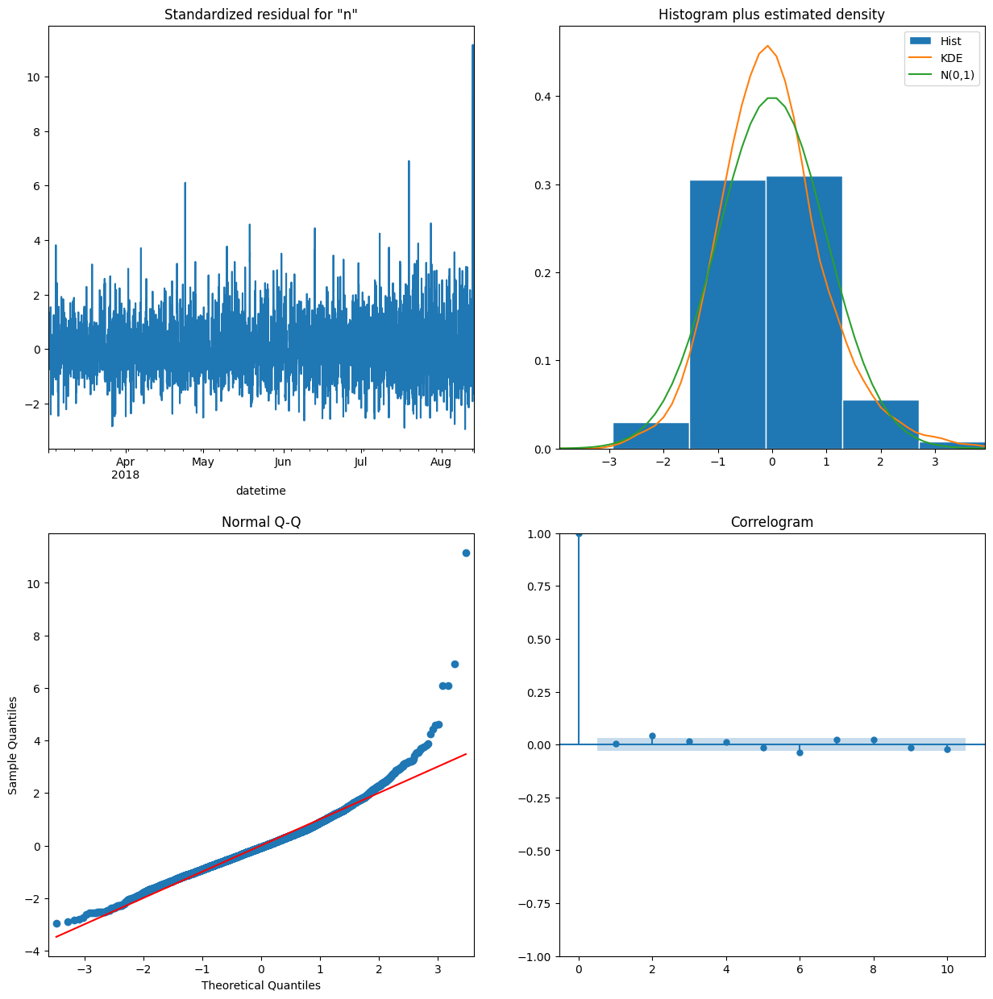

In [144]:
fig=SARIMAmodel5.plot_diagnostics(figsize=(15, 15))
plt.show()

## Prophet

In [145]:
# save the dataset
df_prophet = pd.read_csv('/content/drive/MyDrive/data_projects/taxi.csv', index_col=[0], parse_dates=[0])
df_prophet.sort_index(inplace=True)

In [146]:
# resample by Hour
df_prophet = df_prophet.resample('1H').sum()

In [147]:
# reset index and replace columns names
df_prophet.reset_index(inplace=True)
df_prophet.columns = ['ds', 'y']

In [148]:
df_prophet.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4416 entries, 0 to 4415
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   ds      4416 non-null   datetime64[ns]
 1   y       4416 non-null   int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 69.1 KB


In [149]:
df_prophet.head()

,ds,y
0,2018-03-01 00:00:00,124
1,2018-03-01 01:00:00,85
2,2018-03-01 02:00:00,71
3,2018-03-01 03:00:00,66
4,2018-03-01 04:00:00,43


In [150]:
# train-test split
train = df_prophet.iloc[:len(df_prophet)-442]
test = df_prophet.iloc[len(df_prophet)-442:]

In [151]:
# Create a figure object and add traces for the number of orders
fig = go.Figure()
fig.add_trace(go.Scatter(x=train.ds, y=train.y, name='Train Data'))

# Set the axis labels and plot title
fig.update_layout(title={
        'text': 'Train Data',
        'x': 0.5,
        'y': 0.9
    },
                  xaxis_title='Hour', yaxis_title='Number of orders')
fig.update_xaxes(rangeslider_visible=True)
# Show the plot
fig.show()

In [152]:
# Create a figure object and add traces for the number of orders
fig = go.Figure()
fig.add_trace(go.Scatter(x=test.ds, y=test.y, name='Test Data'))

# Set the axis labels and plot title
fig.update_layout(title={
        'text': 'Test Data',
        'x': 0.5,
        'y': 0.9
    },
                  xaxis_title='Hour', yaxis_title='Number of orders')
fig.update_xaxes(rangeslider_visible=True)
# Show the plot
fig.show()

### Prophet 1

In [153]:
# train model
m = Prophet()
m.fit(train)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpmedp18jo/hrpc7qyw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpmedp18jo/zd09pl5x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49152', 'data', 'file=/tmp/tmpmedp18jo/hrpc7qyw.json', 'init=/tmp/tmpmedp18jo/zd09pl5x.json', 'output', 'file=/tmp/tmpmedp18jo/prophet_modeltsp4zgu2/prophet_model-20230430124627.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:46:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:46:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [154]:
# forecast
future = m.make_future_dataframe(periods=len(test), freq='H')
forecast = m.predict(future)

In [155]:
forecast.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
4411,2018-08-31 19:00:00,125.734940,94.088038,155.601663,125.263614,126.210775,-0.000842,-0.000842,-0.000842,-11.907714,-11.907714,-11.907714,11.906871,11.906871,11.906871,0.0,0.0,0.0,125.734098
4412,2018-08-31 20:00:00,125.758704,102.551285,164.972798,125.286270,126.236650,7.093415,7.093415,7.093415,-4.788392,-4.788392,-4.788392,11.881807,11.881807,11.881807,0.0,0.0,0.0,132.852119
4413,2018-08-31 21:00:00,125.782468,115.627050,177.570776,125.308617,126.262876,21.963885,21.963885,21.963885,10.215086,10.215086,10.215086,11.748799,11.748799,11.748799,0.0,0.0,0.0,147.746354
4414,2018-08-31 22:00:00,125.806232,130.403264,193.906525,125.331023,126.289102,34.921411,34.921411,34.921411,23.413462,23.413462,23.413462,11.507949,11.507949,11.507949,0.0,0.0,0.0,160.727643
4415,2018-08-31 23:00:00,125.829996,135.986263,198.006895,125.352850,126.315327,41.163712,41.163712,41.163712,30.003051,30.003051,30.003051,11.160661,11.160661,11.160661,0.0,0.0,0.0,166.993709


In [156]:
# plot the results
plot_plotly(m, forecast)

In [157]:
plot_components_plotly(m, forecast)

In [158]:
# Create a figure object and add traces for the number of orders
fig = go.Figure()
fig.add_trace(go.Scatter(x=test.ds, y=test.y, name='Actual'))
fig.add_trace(go.Scatter(x=forecast.iloc[-len(test):].ds, y=forecast.iloc[-len(test):]['yhat'], name='Prediction'))

# Set the axis labels and plot title
fig.update_layout(title={
        'text': "Number of Orders in Forecast Period",
        'x': 0.5,
        'y': 0.9
    },
                  xaxis_title='Hour', yaxis_title='Number of orders')
fig.update_xaxes(rangeslider_visible=True)
# Show the plot
fig.show()

In [159]:
error = rmse(test.y, forecast.iloc[-len(test):]['yhat'])
proportion = round(error/ test.y.mean() *100,2)
print("RMSE Prophet model: ", error)
print("Proportion of Error Prophet model: ", proportion)

RMSE Prophet model:  48.19672268933649
Proportion of Error Prophet model:  34.54


### Prophet 2

In [160]:
# add binary column
df_prophet['is_midnight'] = ((df_prophet['ds'].dt.hour == 0) | (df_prophet['ds'].dt.hour <= 2)).astype(int)

In [161]:
# train-test split
train = df_prophet.iloc[:len(df_prophet)-442]
test = df_prophet.iloc[len(df_prophet)-442:]

In [162]:
# train model
m2 = Prophet()
m2.add_regressor('is_midnight')
m2.fit(train)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpmedp18jo/kdvcrar4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpmedp18jo/t9tymggh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88984', 'data', 'file=/tmp/tmpmedp18jo/kdvcrar4.json', 'init=/tmp/tmpmedp18jo/t9tymggh.json', 'output', 'file=/tmp/tmpmedp18jo/prophet_modelsq3mrkjv/prophet_model-20230430124631.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:46:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:46:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [163]:
# forecast
future = m2.make_future_dataframe(periods=len(test), freq='H')
future['is_midnight'] = ((future['ds'].dt.hour == 0) | (future['ds'].dt.hour <= 2)).astype(int)
forecast = m2.predict(future)

In [164]:
forecast.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,is_midnight,is_midnight_lower,is_midnight_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
4411,2018-08-31 19:00:00,123.983942,94.371698,156.452342,123.519250,124.451018,0.787884,0.787884,0.787884,-11.120976,...,0.0,0.0,0.0,11.908859,11.908859,11.908859,0.0,0.0,0.0,124.771825
4412,2018-08-31 20:00:00,124.007578,103.111872,165.006427,123.540948,124.475326,9.583145,9.583145,9.583145,-2.300533,...,0.0,0.0,0.0,11.883678,11.883678,11.883678,0.0,0.0,0.0,133.590723
4413,2018-08-31 21:00:00,124.031214,120.071409,181.274156,123.562645,124.499634,25.525495,25.525495,25.525495,13.774946,...,0.0,0.0,0.0,11.750549,11.750549,11.750549,0.0,0.0,0.0,149.556709
4414,2018-08-31 22:00:00,124.054850,130.263405,192.021883,123.584080,124.523941,36.674223,36.674223,36.674223,25.164649,...,0.0,0.0,0.0,11.509574,11.509574,11.509574,0.0,0.0,0.0,160.729073
4415,2018-08-31 23:00:00,124.078487,131.041370,191.891144,123.605662,124.548249,38.039750,38.039750,38.039750,26.877589,...,0.0,0.0,0.0,11.162161,11.162161,11.162161,0.0,0.0,0.0,162.118236


In [165]:
# plot the results
plot_plotly(m2, forecast)

In [166]:
plot_components_plotly(m2, forecast)

In [167]:
# Create a figure object and add traces for the number of orders
fig = go.Figure()
fig.add_trace(go.Scatter(x=test.ds, y=test.y, name='Actual'))
fig.add_trace(go.Scatter(x=forecast.iloc[-len(test):].ds, y=forecast.iloc[-len(test):]['yhat'], name='Prediction'))

# Set the axis labels and plot title
fig.update_layout(title={
        'text': "Number of Orders in Forecast Period",
        'x': 0.5,
        'y': 0.9
    },
                  xaxis_title='Hour', yaxis_title='Number of orders')
fig.update_xaxes(rangeslider_visible=True)
# Show the plot
fig.show()

In [168]:
error = rmse(test.y, forecast.iloc[-len(test):]['yhat'])
proportion = round(error/ test.y.mean() *100,2)
print("RMSE Prophet model: ", error)
print("Proportion of Error Prophet model: ", proportion)

RMSE Prophet model:  48.17356073865567
Proportion of Error Prophet model:  34.52


### Prophet 3

In [169]:
# add binary column
df_prophet['is_midnight'] = (df_prophet['ds'].dt.hour <= 2).astype(int)
df_prophet['is_monday'] = (df_prophet['ds'].dt.dayofweek == 0).astype(int)

In [170]:
# train-test split
train = df_prophet.iloc[:len(df_prophet)-442]
test = df_prophet.iloc[len(df_prophet)-442:]

In [171]:
# train model
m3 = Prophet()
m3.add_regressor('is_midnight')
m3.add_regressor('is_monday')
m3.fit(train)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpmedp18jo/8lnrr0ex.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpmedp18jo/2huasgb5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=60125', 'data', 'file=/tmp/tmpmedp18jo/8lnrr0ex.json', 'init=/tmp/tmpmedp18jo/2huasgb5.json', 'output', 'file=/tmp/tmpmedp18jo/prophet_modelw_puggz3/prophet_model-20230430124635.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:46:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:46:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [172]:
# forecast
future = m3.make_future_dataframe(periods=len(test), freq='H')
future['is_midnight'] = (future['ds'].dt.hour <= 2).astype(int)
future['is_monday'] = (future['ds'].dt.dayofweek == 0).astype(int)
forecast = m3.predict(future)

In [173]:
forecast.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,is_monday,is_monday_lower,is_monday_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
4411,2018-08-31 19:00:00,123.993022,92.550112,155.349169,123.584532,124.446428,0.794267,0.794267,0.794267,-11.125318,...,0.0,0.0,0.0,11.919585,11.919585,11.919585,0.0,0.0,0.0,124.787289
4412,2018-08-31 20:00:00,124.016687,102.366860,163.388793,123.605431,124.472402,9.578408,9.578408,9.578408,-2.314688,...,0.0,0.0,0.0,11.893096,11.893096,11.893096,0.0,0.0,0.0,133.595095
4413,2018-08-31 21:00:00,124.040351,120.046502,181.041177,123.626258,124.498376,25.513924,25.513924,25.513924,13.754962,...,0.0,0.0,0.0,11.758962,11.758962,11.758962,0.0,0.0,0.0,149.554275
4414,2018-08-31 22:00:00,124.064016,131.050311,190.918937,123.647200,124.524264,36.673157,36.673157,36.673157,25.155847,...,0.0,0.0,0.0,11.517310,11.517310,11.517310,0.0,0.0,0.0,160.737173
4415,2018-08-31 23:00:00,124.087681,130.036290,193.699034,123.667859,124.549904,38.067436,38.067436,38.067436,26.897870,...,0.0,0.0,0.0,11.169566,11.169566,11.169566,0.0,0.0,0.0,162.155117


In [174]:
# plot the results
plot_plotly(m3, forecast)

In [175]:
plot_components_plotly(m3, forecast)

In [176]:
# Create a figure object and add traces for the number of orders
fig = go.Figure()
fig.add_trace(go.Scatter(x=test.ds, y=test.y, name='Actual'))
fig.add_trace(go.Scatter(x=forecast.iloc[-len(test):].ds, y=forecast.iloc[-len(test):]['yhat'], name='Prediction'))

# Set the axis labels and plot title
fig.update_layout(title={
        'text': "Number of Orders in Forecast Period",
        'x': 0.5,
        'y': 0.9
    },
                  xaxis_title='Hour', yaxis_title='Number of orders')
fig.update_xaxes(rangeslider_visible=True)
# Show the plot
fig.show()

In [177]:
error = rmse(test.y, forecast.iloc[-len(test):]['yhat'])
proportion = round(error/ test.y.mean() *100,2)
print("RMSE Prophet model: ", error)
print("Proportion of Error Prophet model: ", proportion)

RMSE Prophet model:  48.16195654485993
Proportion of Error Prophet model:  34.51


### Prophet 4

In [178]:
df_prophet.head()

,ds,y,is_midnight,is_monday
0,2018-03-01 00:00:00,124,1,0
1,2018-03-01 01:00:00,85,1,0
2,2018-03-01 02:00:00,71,1,0
3,2018-03-01 03:00:00,66,0,0
4,2018-03-01 04:00:00,43,0,0


In [179]:
# train model
m4 = Prophet(daily_seasonality=True, weekly_seasonality=False)
m4.add_regressor('is_midnight')
m4.add_regressor('is_monday')
m4.fit(train)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpmedp18jo/tv6230zy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpmedp18jo/b6jd9x3v.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75798', 'data', 'file=/tmp/tmpmedp18jo/tv6230zy.json', 'init=/tmp/tmpmedp18jo/b6jd9x3v.json', 'output', 'file=/tmp/tmpmedp18jo/prophet_model8wmuov2n/prophet_model-20230430124639.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:46:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:46:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [180]:
# forecast
future = m4.make_future_dataframe(periods=len(test), freq='H')
future['is_midnight'] = (future['ds'].dt.hour <= 2).astype(int)
future['is_monday'] = (future['ds'].dt.dayofweek == 0).astype(int)
forecast = m4.predict(future)

In [181]:
forecast.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,is_midnight,is_midnight_lower,is_midnight_upper,is_monday,is_monday_lower,is_monday_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
4411,2018-08-31 19:00:00,123.569491,80.664516,145.677589,123.044814,124.092915,-11.120236,-11.120236,-11.120236,-11.120236,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,112.449254
4412,2018-08-31 20:00:00,123.593447,87.870039,156.571821,123.067470,124.117954,-2.299796,-2.299796,-2.299796,-2.299796,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,121.293651
4413,2018-08-31 21:00:00,123.617404,104.799442,172.118258,123.090125,124.143956,13.777417,13.777417,13.777417,13.777417,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,137.394820
4414,2018-08-31 22:00:00,123.641360,115.370341,183.023359,123.112780,124.170803,25.175231,25.175231,25.175231,25.175231,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,148.816591
4415,2018-08-31 23:00:00,123.665316,115.926445,183.264413,123.135436,124.195815,26.901884,26.901884,26.901884,26.901884,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,150.567200


In [182]:
# plot the results
plot_plotly(m4, forecast)

In [183]:
plot_components_plotly(m4, forecast)

In [184]:
# Create a figure object and add traces for the number of orders
fig = go.Figure()
fig.add_trace(go.Scatter(x=test.ds, y=test.y, name='Actual'))
fig.add_trace(go.Scatter(x=forecast.iloc[-len(test):].ds, y=forecast.iloc[-len(test):]['yhat'], name='Prediction'))

# Set the axis labels and plot title
fig.update_layout(title={
        'text': "Number of Orders in Forecast Period",
        'x': 0.5,
        'y': 0.9
    },
                  xaxis_title='Hour', yaxis_title='Number of orders')
fig.update_xaxes(rangeslider_visible=True)
# Show the plot
fig.show()

In [185]:
error = rmse(test.y, forecast.iloc[-len(test):]['yhat'])
proportion = round(error/ test.y.mean() *100,2)
print("RMSE Prophet model: ", error)
print("Proportion of Error Prophet model: ", proportion)

RMSE Prophet model:  48.7134535716523
Proportion of Error Prophet model:  34.91


### Prophet 5

In [186]:
param_grid = {  
    'changepoint_prior_scale': [0.01, 0.1, 0.5, 0.75],
    'seasonality_prior_scale': [0.1, 1.0, 10.0, 30],
}

# Generate all combinations of parameters
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
rmses = []  # Store the RMSEs for each params here

# Use cross validation to evaluate all parameters
for params in all_params:
    m5 = Prophet(**params)
    m5.add_regressor('is_midnight')
    m5.add_regressor('is_monday')
    m5.fit(train)# Fit model with given params
    df_cv = cross_validation(m5, initial='2000 hours', period='442 hours', horizon='442 hours', parallel='processes')
    df_p = performance_metrics(df_cv, metrics=['rmse'])
    rmses.append(df_p['rmse'].mean())

# Find the best parameters
tuning_results = pd.DataFrame(all_params)
tuning_results['rmse'] = rmses
print(tuning_results)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpmedp18jo/jiws3tao.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpmedp18jo/7tc9ed32.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34037', 'data', 'file=/tmp/tmpmedp18jo/jiws3tao.json', 'init=/tmp/tmpmedp18jo/7tc9ed32.json', 'output', 'file=/tmp/tmpmedp18jo/prophet_model2y234iv7/prophet_model-20230430124643.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:46:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:46:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 4 forecasts with cutoffs between 2018-05-31 21:00:00 and 2018-07-26 03:00:00
INFO:prophet:Applying in parallel with <con

    changepoint_prior_scale  seasonality_prior_scale       rmse
0                      0.01                      0.1  27.547452
1                      0.01                      1.0  27.550498
2                      0.01                     10.0  27.541345
3                      0.01                     30.0  27.542577
4                      0.10                      0.1  27.488404
5                      0.10                      1.0  27.486340
6                      0.10                     10.0  27.496395
7                      0.10                     30.0  27.494880
8                      0.50                      0.1  27.508920
9                      0.50                      1.0  27.501849
10                     0.50                     10.0  27.504698
11                     0.50                     30.0  27.509753
12                     0.75                      0.1  27.543648
13                     0.75                      1.0  27.553126
14                     0.75             

In [187]:
# Calculate performance metrics
df_p = performance_metrics(df_cv, metrics=['rmse'])
df_p['rmse'].mean()

27.549773392158823

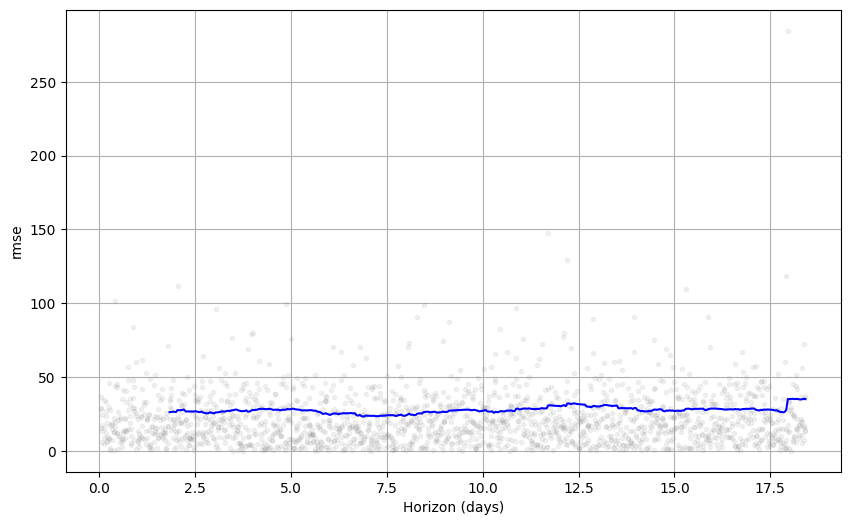

In [188]:
fig = plot_cross_validation_metric(df_cv, metric='rmse')

In [189]:
# train model
m5 = Prophet(changepoint_prior_scale=0.1, seasonality_prior_scale=1, changepoint_range=0.85)
m5.add_regressor('is_midnight')
m5.add_regressor('is_monday')
m5.add_seasonality(name='monthly', period=732, fourier_order=3)
m5.add_seasonality(name='weekly', period=168, fourier_order=3, prior_scale=0.5)
m5.fit(train)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Found custom seasonality named 'weekly', disabling built-in 'weekly' seasonality.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpmedp18jo/p_i_ot63.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpmedp18jo/336s6o5v.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=84355', 'data', 'file=/tmp/tmpmedp18jo/p_i_ot63.json', 'init=/tmp/tmpmedp18jo/336s6o5v.json', 'output', 'file=/tmp/tmpmedp18jo/prophet_modelgj9kk5t0/prophet_model-20230430124825.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:48:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:48:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [190]:
# forecast
future = m5.make_future_dataframe(periods=len(test), freq='H')
future['is_midnight'] = (future['ds'].dt.hour <= 2).astype(int)
future['is_monday'] = (future['ds'].dt.dayofweek == 0).astype(int)
forecast = m5.predict(future)

In [191]:
forecast.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,monthly,monthly_lower,monthly_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
4411,2018-08-31 19:00:00,179.904917,95.705415,160.704435,178.748313,181.107287,-49.966276,-49.966276,-49.966276,-11.119203,...,-21.701824,-21.701824,-21.701824,-17.145249,-17.145249,-17.145249,0.0,0.0,0.0,129.938641
4412,2018-08-31 20:00:00,179.934794,108.044588,169.395215,178.773892,181.140775,-41.100145,-41.100145,-41.100145,-2.302585,...,-21.617769,-21.617769,-21.617769,-17.179790,-17.179790,-17.179790,0.0,0.0,0.0,138.834650
4413,2018-08-31 21:00:00,179.964672,122.344849,189.699290,178.797702,181.174264,-24.975711,-24.975711,-24.975711,13.772234,...,-21.533666,-21.533666,-21.533666,-17.214279,-17.214279,-17.214279,0.0,0.0,0.0,154.988961
4414,2018-08-31 22:00:00,179.994549,135.849995,199.567415,178.821511,181.207753,-13.524815,-13.524815,-13.524815,25.173414,...,-21.449516,-21.449516,-21.449516,-17.248714,-17.248714,-17.248714,0.0,0.0,0.0,166.469733
4415,2018-08-31 23:00:00,180.024426,138.175663,200.372649,178.845320,181.241242,-11.738696,-11.738696,-11.738696,26.909718,...,-21.365318,-21.365318,-21.365318,-17.283097,-17.283097,-17.283097,0.0,0.0,0.0,168.285730


In [192]:
# plot the results
plot_plotly(m5, forecast)

In [193]:
fig = plot_components_plotly(m5, forecast)
pio.show(fig)

In [194]:
# Create a figure object and add traces for the number of orders
fig = go.Figure()
fig.add_trace(go.Scatter(x=test.ds, y=test.y, name='Actual'))
fig.add_trace(go.Scatter(x=forecast.iloc[-len(test):].ds, y=forecast.iloc[-len(test):]['yhat'], name='Prediction'))

# Set the axis labels and plot title
fig.update_layout(title={
        'text': "Number of Orders in Forecast Period",
        'x': 0.5,
        'y': 0.9
    },
                  xaxis_title='Hour', yaxis_title='Number of orders')
fig.update_xaxes(rangeslider_visible=True)
# Show the plot
fig.show()

In [195]:
error = rmse(test.y, forecast.iloc[-len(test):]['yhat'])
proportion = round(error/ test.y.mean() *100,2)
print("RMSE Prophet model: ", error)
print("Proportion of Error Prophet model: ", proportion)

RMSE Prophet model:  45.349033341827266
Proportion of Error Prophet model:  32.5


## Final Conclusions

Four algorithms are used to built several models of time series in this project.

A. The linear regression model came up with RMSE of 51.7.
    
    It seems to be able to catch for regressiveness and generalization, but unable to cover for randomness.

B. The ARIMA model with the best RMSE of 43.5 and also predictiveness of AIC and BIC is the model with order (25, 2, 36).

    The residue of this model has isignificant autocorrelation, although its normal distribution could be better.

C. The best SARIMA model order=(0,1,2), seasonal_order=(0,1,2,24) is the best model built with SARIMA. 

    With lowest AIC and BIC, and also no auto correlaion in the residue, it has good qualities of model.
    
    Although the RMSE it produces is not the lowest (44), it meets the criteria of anticipating peak points.

    It is important to balance the trade-off between model accuracy and model complexity
    
    The SARIMA model with order (1,1,0) (0,1,2,24) results in the best RMSE of 39.8.
    
    However it also results in higher AIC and BIC.
    
    Also, in terms of residue, it has noticeable autocorrelation.

    It is probably a sign that the model is overfitting.

    Furthermore, the analysis of ACF and PCF plots done at stage of data analysis shows that the time series is daily seasonal, and most likely not an AR model. That is why the model with order (0,1,2)(0,1,2,24) is the best among other built here.

D. The Prophet model with the best RMSE of 45.3 is one with hyperparemeters tuned using Cross Validation (CV).

    Using CV, it is found that changepoint_prior_scale of 0.1, and seasonality_prior_scale of 1 are the parameters result in least RMSE.

    In addition to that changepoint_range is set at 0.85.

    Also, flagging is added for midnight hours and Monday.

    Seasonality of day is applied, while monthly trend and bi-weekly seasonality are also captured.

    The result is a model with the least overfitting, and trend that manage to mirror the trend of the actual data.